In [1]:
import pandas as pd
from scipy.stats import *
from scipy.stats import kurtosis
from statsmodels.robust.scale import mad
from numpy.fft import *
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import datetime
from datetime import datetime
from datetime import time
import warnings
warnings.filterwarnings(action='ignore')
from matplotlib.pylab import style
import seaborn as sns
from statsmodels.nonparametric.smoothers_lowess import lowess
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.stats.diagnostic import acorr_ljungbox as ljbox

style.use('ggplot')

# 0 读取数据
- 读取老师提供的第二组风电数据

In [2]:
Fengdian_data=pd.read_csv('Fengdiandata.csv',encoding='utf-8')
print(Fengdian_data)

            DateAcqTime  GridPower  wind_Spd
0        2015/10/1 0:00    0.38065   0.39627
1        2015/10/1 0:00    0.36943   0.39592
2        2015/10/1 0:01    0.38529   0.39538
3        2015/10/1 0:01    0.38892   0.39579
4        2015/10/1 0:02    0.41220   0.39627
...                 ...        ...       ...
74875  2015/10/31 23:57    0.10177   0.27803
74876  2015/10/31 23:58    0.10354   0.27682
74877  2015/10/31 23:58    0.10008   0.27529
74878  2015/10/31 23:59    0.10516   0.27481
74879  2015/10/31 23:59    0.10410   0.27452

[74880 rows x 3 columns]


 # 1 数据统计特性的描述和分析

 # 1.1 位置估计
 ### 分别得到GridPower和WindSpeed的均值、结尾均值、中位数

In [3]:
#1.GridPower均值：
GridPower=Fengdian_data['GridPower']
GP_mean=GridPower.mean()
print('GridPower的均值为：{:.5f}'.format(GP_mean))
#2.WindSpeed均值：
WindSpeed=Fengdian_data['wind_Spd']
Spd_mean=WindSpeed.mean()
print('WindSpeed的均值为：{:.5f}'.format(Spd_mean))
#3.GridPower截尾均值：
GP_Trim_mean=trim_mean(GridPower,0.1)
print('GridPower的截尾均值为：{:.5f}'.format(GP_Trim_mean))
#4.WindSpeed截尾均值：
Spd_Trim_mean=trim_mean(WindSpeed,0.1)
print('WindSpeed的截尾均值为：{:.5f}'.format(Spd_Trim_mean))
#5.GridPower中位数
GP_median=GridPower.median()
print('GridPower的中位数为：{:.5f}'.format(GP_median))
#6.WindSpeed中位数
Spd_median=WindSpeed.median()
print('WindSpeed的中位数为：{:.5f}'.format(Spd_median))

GridPower的均值为：0.32731
WindSpeed的均值为：0.36272
GridPower的截尾均值为：0.29014
WindSpeed的截尾均值为：0.34701
GridPower的中位数为：0.22958
WindSpeed的中位数为：0.34239


### 把求得的位置估计放入美观的表格中

In [4]:
Position_Estimate=pd.DataFrame({'均值':[GP_mean,Spd_mean],
                '截尾均值':[GP_Trim_mean,Spd_Trim_mean],
                '中位数':[GP_median,Spd_median]},
               index=['GridPower','WindSpeed'])
Position_Estimate

,均值,截尾均值,中位数
GridPower,0.327315,0.290137,0.229580
WindSpeed,0.362716,0.347014,0.342385


## 1.2 变异性估计

### 标准差、MAD、IQR、极差

In [5]:
#1.标准差                   #使用广泛，但对离群值非常敏感
GP_std=GridPower.std()
WS_std=WindSpeed.std()
print('GP_std:',GP_std)
print('WS_std:',WS_std)
#2.中位数绝对偏差（MAD）        #健壮的变异性估计
GP_MAD=mad(GridPower)
print('GP_MAD:',GP_MAD)
WS_MAD=mad(WindSpeed)
print('WS_MAD:',WS_MAD)   
#3.四分位距IQR：                #健壮的变异性估计
GP_IQR=GridPower.quantile(0.75)-GridPower.quantile(0.25)
print('GP_IQR:',GP_IQR)
WS_IQR=WindSpeed.quantile(0.75)-WindSpeed.quantile(0.25)
print('WS_IQR:',WS_IQR)
#4，极差
GP_range=GridPower.max()-GridPower.min()
print('GP_range:',GP_range)
WS_range=WindSpeed.max()-WindSpeed.min()
print('WS_range:',WS_range)


GP_std: 0.2871813789195412
WS_std: 0.1378172648795316
GP_MAD: 0.2351807421148881
WS_MAD: 0.12104705812988982
GP_IQR: 0.41083450000000005
WS_IQR: 0.165935
GP_range: 0.99971516
WS_range: 0.87783


### 峰度、偏度

In [6]:
#5.峰度
GP_kurt=kurtosis(GridPower)
print('GP_kurt:',GP_kurt)
WS_kurt=kurtosis(WindSpeed)
print('WS_kurt:',WS_kurt)

#6.偏度
GP_skew=skew(GridPower)
print('GP_skew:',GP_skew)
WS_skew=skew(WindSpeed)
print('WS_skew:',WS_skew)

GP_kurt: -0.30759083650765096
WS_kurt: 2.859494109823051
GP_skew: 0.9238923721705388
WS_skew: 1.3922019819732978


### 总结变异性估计为表格

In [7]:
Variability_Estimate=pd.DataFrame({'标准差':[GP_std,WS_std],
                'MAD':[GP_MAD,WS_MAD],
                'IQR':[GP_IQR,WS_IQR],
                 'Range':[GP_range,WS_range],
                '峰度':[GP_kurt,WS_kurt],
                '偏度':[GP_skew,WS_skew]
                                  },
               index=['GridPower','WindSpeed'])
Variability_Estimate

,标准差,MAD,IQR,Range,峰度,偏度
GridPower,0.287181,0.235181,0.410835,0.999715,-0.307591,0.923892
WindSpeed,0.137817,0.121047,0.165935,0.877830,2.859494,1.392202


## 1.3数据分布的可视化

## 1.3.1 箱型图

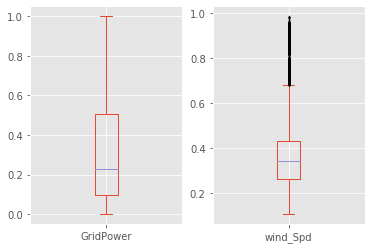

In [8]:
plt.subplot(1, 2, 1)
ax=GridPower.plot.box()
plt.rcParams['boxplot.flierprops.markersize'] = 0.5
# wspace=0.15,hspace=0.15
plt.subplots_adjust(left=None,bottom=None,right=None,top=None,wspace=0.2,hspace=0.15)
plt.subplot(1, 2, 2)
bx=WindSpeed.plot.box()    #WindSpeed离群值很多

## 1.3.2 小提琴图

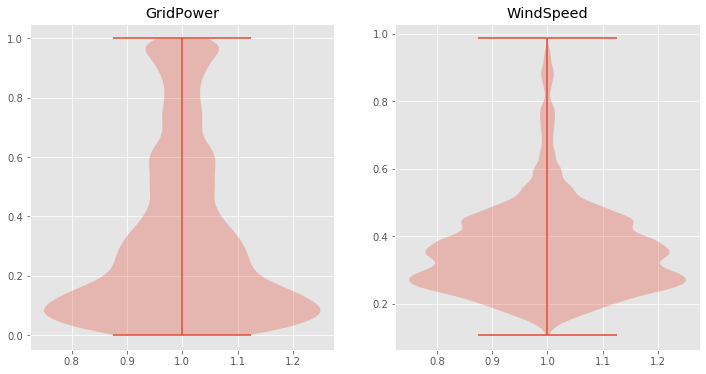

In [9]:
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].violinplot(GridPower)
axes[0].set_title('GridPower')
axes[1].violinplot(WindSpeed)
axes[1].set_title('WindSpeed')
plt.show()

## 1.3.3 按不同日期的小提琴图

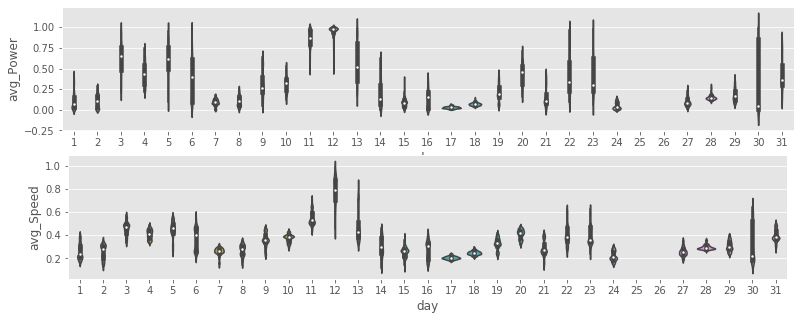

In [10]:
figure=plt.figure(figsize=(40,5))
plt.tight_layout()

axes = figure.add_subplot(2,1,1)
axes.set_aspect(aspect=3.5)
df_new_avg=pd.read_csv('Fengdian_AVG.csv')
sns.violinplot(x = 'day', y= 'avg_Power', data = df_new_avg)

axes = figure.add_subplot(2,1,2)
axes.set_aspect(aspect=5)
df_new_avg=pd.read_csv('Fengdian_AVG.csv')
sns.violinplot(x = 'day', y= 'avg_Speed', data = df_new_avg)

## 1.3.4 频数表&直方图&密度图

Text(0.5, 0, 'WindSpeed')

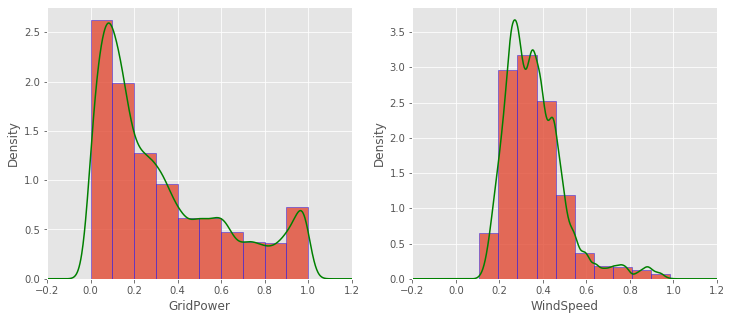

In [11]:
binnedGP=pd.cut(GridPower,10)
binnedGP.value_counts()
plt.subplot(1, 2, 1)
ax=GridPower.plot.hist(density=True,edgecolor="b",figsize=(12,5),alpha=0.8)
GridPower.plot.density(ax=ax,color='g')
ax.set_xlim(-0.2,1.2)
ax.set_xlabel('GridPower')
# plt.subplots_adjust(left=None,bottom=None,right=None,top=None,wspace=1,hspace=1)
plt.subplot(1, 2, 2)
ax=WindSpeed.plot.hist(density=True,edgecolor="b",figsize=(12,5),alpha=0.8)
WindSpeed.plot.density(ax=ax,color='g')
ax.set_xlim(-0.2,1.2)
ax.set_xlabel('WindSpeed')

# 2 数据清洗和预处理
一共31天，完整的数据是 每天2880个数据（每分钟两个数据），但是只有26*2880行数据，因此必然有缺失。先找到缺失

## 2.1 日期预处理

### 2.1.1把日期格式转换为按年、月、日、时、分、秒分别列入表格中

In [12]:
df=Fengdian_data['DateAcqTime']
df=pd.to_datetime(df)
df

def get_ymd(date):
    Y,M,D,H,m=[],[],[],[],[]
    for i in range(len(date)):
        oneday=date[i]
        year=oneday.year
        month=oneday.month
        day=oneday.day
        hour=oneday.hour
        minute=oneday.minute

        Y.append(year)
        M.append(month)
        D.append(day)
        H.append(hour)
        m.append(minute)
    date=pd.DataFrame()
#     date['year']=Y
#     date['month']=M
    date['day']=D
#     date['hour']=H
#     date['minute']=m
    return date
df=get_ymd(df)
df 
Fengdian_data=pd.concat([df,Fengdian_data],axis=1)
Fengdian_data

,day,DateAcqTime,GridPower,wind_Spd
0,1,2015/10/1 0:00,0.38065,0.39627
1,1,2015/10/1 0:00,0.36943,0.39592
2,1,2015/10/1 0:01,0.38529,0.39538
3,1,2015/10/1 0:01,0.38892,0.39579
4,1,2015/10/1 0:02,0.41220,0.39627
...,...,...,...,...
74875,31,2015/10/31 23:57,0.10177,0.27803
74876,31,2015/10/31 23:58,0.10354,0.27682
74877,31,2015/10/31 23:58,0.10008,0.27529
74878,31,2015/10/31 23:59,0.10516,0.27481


### 2.1.2 给原始数据加上一列 HH：MM：SS

In [13]:
thistimelist=[]
for i in range(len(Fengdian_data)):
    thisline=Fengdian_data.iloc[i,:]
#     thistime=datetime.time(pd.to_datetime(thisline['DateAcqTime']))
    thistime=datetime.strftime(pd.to_datetime(thisline['DateAcqTime']),'%H:%M:%S')
    thistimelist.append(thistime)
# print(thistimelist)
ttl=pd.DataFrame(thistimelist,columns=['Time'])

Fengdian_data=pd.concat([ttl,Fengdian_data],axis=1)
Fengdian_data

,Time,day,DateAcqTime,GridPower,wind_Spd
0,00:00:00,1,2015/10/1 0:00,0.38065,0.39627
1,00:00:00,1,2015/10/1 0:00,0.36943,0.39592
2,00:01:00,1,2015/10/1 0:01,0.38529,0.39538
3,00:01:00,1,2015/10/1 0:01,0.38892,0.39579
4,00:02:00,1,2015/10/1 0:02,0.41220,0.39627
...,...,...,...,...,...
74875,23:57:00,31,2015/10/31 23:57,0.10177,0.27803
74876,23:58:00,31,2015/10/31 23:58,0.10354,0.27682
74877,23:58:00,31,2015/10/31 23:58,0.10008,0.27529
74878,23:59:00,31,2015/10/31 23:59,0.10516,0.27481


## 2.2 定位缺失值并预留为NAN

### 2.2.1 生成一个完整的日期序列（1440*2=2880）作为标准时间，由此找到哪些时间缺失

In [14]:
b=pd.date_range(start='00:00',periods=1440,freq='1min')
timelist=[]
time1440list=[]
for i in b:
    daty=datetime.strftime(i,'%H:%M:%S')
    timelist.append(daty)
    timelist.append(daty)
    time1440list.append(daty)


### 2.2.2 原数据的缺失情况展示

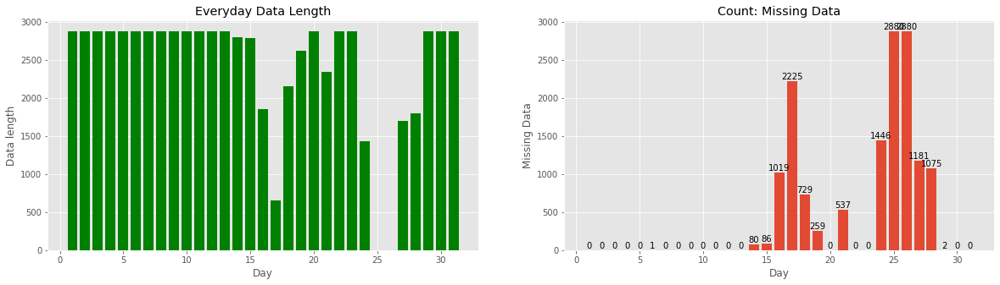

In [15]:
fig,ax=plt.subplots(1,2,figsize=(20,5))
length=[]
days=np.arange(1,32,1)
for i in range(1,32):
    dfi=Fengdian_data[Fengdian_data['day']==i]
    length.append(len(dfi))
length=np.array(length)
ax[0].bar(days,length,color='g')
ax[0].set_xlabel('Day')
ax[0].set_ylabel('Data length')
ax[0].set_title('Everyday Data Length')

missingdata=24*60*2-length
p2=ax[1].bar(days,missingdata)
ax[1].set_xlabel('Day')
ax[1].set_ylabel('Missing Data')
ax[1].set_title('Count: Missing Data')

for a,b in zip(days,missingdata):
    plt.text(a,b,
             b,
             ha='center', 
             va='bottom',
            )


### 2.2.3 把缺失的时间的数据都留成空行
生成`Fengdian_addNAN.csv`


In [16]:
dfnew=pd.DataFrame(columns=Fengdian_data.columns)
for i in range(1,32):
    thisday=Fengdian_data[Fengdian_data['day']==i]
    thisday.reset_index(drop=True, inplace=True) 
    thisday=pd.DataFrame(thisday)
    for j in range(len(timelist)):
        if (len(thisday)>j):
            thisline=(thisday.iloc[j]).to_dict()

            time=thisline['Time']  #第j行的时间
            if time !=timelist[j]:
                thisday=pd.DataFrame(np.insert(thisday.values,j,values=[timelist[j],i,np.nan,np.nan,np.nan],axis=0))
                thisday.columns=Fengdian_data.columns
        else:
                thisday=pd.DataFrame(np.insert(thisday.values,j,values=[timelist[j],i,np.nan,np.nan,np.nan],axis=0))
                thisday.columns=Fengdian_data.columns

    dfnew=dfnew.append(thisday,ignore_index=True)
print((dfnew))
# dfnew.to_csv('Fengdian_addNAN.csv')


           Time day       DateAcqTime GridPower wind_Spd
0      00:00:00   1    2015/10/1 0:00   0.38065  0.39627
1      00:00:00   1    2015/10/1 0:00   0.36943  0.39592
2      00:01:00   1    2015/10/1 0:01   0.38529  0.39538
3      00:01:00   1    2015/10/1 0:01   0.38892  0.39579
4      00:02:00   1    2015/10/1 0:02    0.4122  0.39627
...         ...  ..               ...       ...      ...
89275  23:57:00  31  2015/10/31 23:57   0.10177  0.27803
89276  23:58:00  31  2015/10/31 23:58   0.10354  0.27682
89277  23:58:00  31  2015/10/31 23:58   0.10008  0.27529
89278  23:59:00  31  2015/10/31 23:59   0.10516  0.27481
89279  23:59:00  31  2015/10/31 23:59    0.1041  0.27452

[89280 rows x 5 columns]


## 2.3 将时间相同的数据取平均

### 2.3.1 时间相同的数据取平均

In [17]:
dfnew=pd.read_csv('Fengdian_addNAN.csv')
days=np.arange(1,32,1)

# speed = np.array(dfnew['wind_Spd'])
# power = np.array(dfnew['GridPower'])
# dfnew1=dfnew
# dfnew1
dfnew['avg_Power']=(dfnew['GridPower']+(dfnew['GridPower'].shift(-1)))/2
dfnew['avg_Speed']=(dfnew['wind_Spd']+(dfnew['wind_Spd'].shift(-1)))/2            
# print(dfnew)
df_new_avg=dfnew[dfnew.index%2==0]
df_new_avg=df_new_avg.drop(df_new_avg.columns[0],axis=1)
df_new_avg.reset_index(drop=True, inplace=True) 

# print(df_new_avg)
#   
        

### 2.3.2 添加每天的时间编号1-1440 和取平均，生成`Fengdian_AVG.csv`，再只保留avg后的数值生成`Fengdian_CleanAVG.csv`

In [18]:
daytime=[i for i in range(1,1441)]
daytimeall=[]
for i in range(1,32):
    daytimeall.extend(daytime)
# times=np.arange(1,1441)
# alltimes=times.repeat(31,axis=0)
# alltimes

df_new_avg['TimeinDay']=pd.DataFrame(daytimeall)
df_new_avg
# df_new_avg.to_csv('Fengdian_AVG.csv',index=False)     
dfTD_AVG=df_new_avg[['Time','day','avg_Power','avg_Speed','TimeinDay']]
# dfTD_AVG.to_csv('Fengdian_CleanAVG.csv',index=False)

### 2.3.3 查看取平均后数据的缺失情况

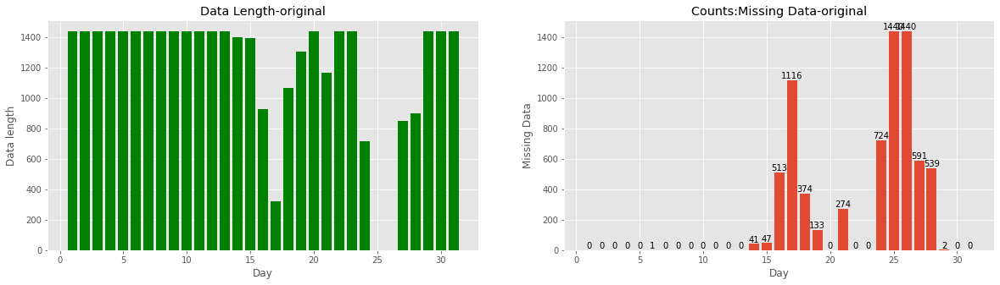

In [19]:
def draw_missing_counts(df_new_avg,title1,title2):
    fig,ax=plt.subplots(1,2,figsize=(20,5))
    length=[]
    days=np.arange(1,32,1)
    for i in range(1,32):
        dfi=df_new_avg[df_new_avg['day']==i]
        miss=dfi.isnull()
        misindexylen=len(dfi[miss.any(axis=1)==False].index.tolist())
        length.append(misindexylen)
    length=np.array(length)
    ax[0].bar(days,length,color='g')
    ax[0].set_xlabel('Day')
    ax[0].set_ylabel('Data length')
    ax[0].set_title(title1)

    missingdata=24*60-length
    p2=ax[1].bar(days,missingdata)
    ax[1].set_xlabel('Day')
    ax[1].set_ylabel('Missing Data')
    ax[1].set_title(title2)
    
    for a,b in zip(days,missingdata):
        plt.text(a,b,
                 b,
                 ha='center', 
                 va='bottom',
                )
df_new_avg=pd.read_csv('Fengdian_AVG.csv')
draw_missing_counts(df_new_avg,'Data Length-original','Counts:Missing Data-original')

## 2.4 缺失值处理
##### 先看一下ForwardFill和MovingAverage的填充效果

### 2.4.1 Forward Fill填充缺失值效果观察

In [20]:
df_new_avg=pd.read_csv('Fengdian_AVG.csv')
miss = df_new_avg.isnull()
misindex=df_new_avg[miss.any(axis=1)==True].index.tolist()   #有缺失值的行的index
df_new_avg['f_fill_WindSpeed']=df_new_avg['avg_Speed']
df_new_avg['f_fill_WindSpeed'].ffill(inplace=True)
# print(misindex)

#### 利用一天（10/1）完整的数据，删除一些数据并用ForwardFill补上，拿补上的数据和真实数据做比较，看看填补效果

In [21]:
df_new_avg=pd.read_csv('Fengdian_AVG.csv')
df101=df_new_avg[df_new_avg['day']==1]
# 构建一列随机缺失值列
df101['missing'] = df101['avg_Speed']
# 随机选择10%行手动填充缺失值
mis_index = df101.sample(frac=0.1,random_state=999).index
df101.loc[mis_index,'missing']=None

In [22]:
#利用forward fill填补缺失值
df101['f_fill'] = df101['missing']
df101['f_fill'].ffill(inplace=True)

Text(0.5, 1.0, '选取10/1(数据完整),构造缺失点,利用ForwardFill填充并与真实值比较的结果')

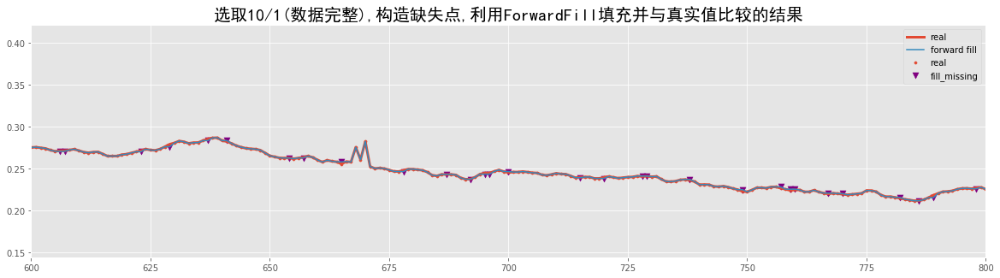

In [23]:
plt.figure(figsize=(20,5))
plt.scatter(df101.index,df101.avg_Speed,s=10,label='real')
plt.plot(df101.index,df101.avg_Speed,label='real',linewidth=3)

# plt.scatter(df101[~df101.index.isin(mis_index)].index,df101[~df101.index.isin(mis_index)].f_fill,s=10,c='g',label='not_missing')
plt.scatter(df101.loc[mis_index].index,df101.loc[mis_index].f_fill,s=50,c='purple',marker='v',label='fill_missing')
plt.plot(df101.index,df101.f_fill,label='forward fill')
plt.xlim(600,800)
plt.legend()
plt.title('选取10/1(数据完整),构造缺失点,利用ForwardFill填充并与真实值比较的结果',fontproperties = 'SimHei',fontsize = 20)

#### 可以看出离散的偶尔缺失点时，前向平均法ForwardFill填充比较精确

### 2.4.2 观察Forward_Fill填充效果-31天全部

Text(0.5, 1.0, '31天Forward_Fill结果')

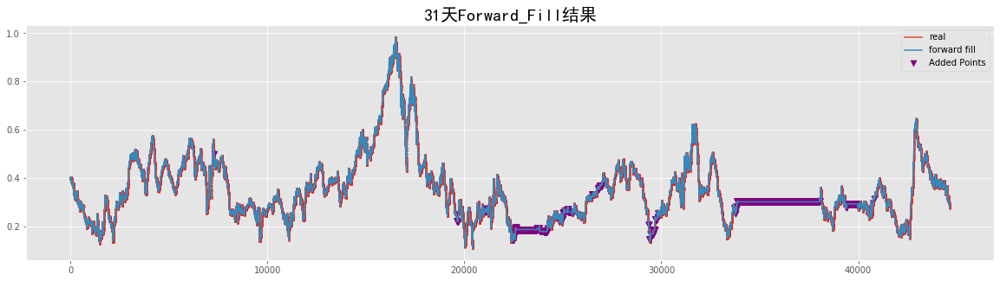

In [24]:
df_new_avg=pd.read_csv('Fengdian_AVG.csv')
miss = df_new_avg.isnull()
misindex=df_new_avg[miss.any(axis=1)==True].index.tolist()   #有缺失值的行的index
df_new_avg['f_fill_WindSpeed']=df_new_avg['avg_Speed']
df_new_avg['f_fill_WindSpeed'].ffill(inplace=True)
#观察填充效果
plt.figure(figsize=(20,5))
plt.scatter(df_new_avg.index,df_new_avg.avg_Speed,s=5)
plt.plot(df_new_avg.index,df_new_avg.avg_Speed,label='real')
plt.scatter(df_new_avg[~df_new_avg.index.isin(misindex)].index,df_new_avg[~df_new_avg.index.isin(misindex)].f_fill_WindSpeed,s=1,c='r')
plt.scatter(df_new_avg.loc[misindex].index,df_new_avg.loc[misindex].f_fill_WindSpeed,s=50,c='purple',marker='v',label='Added Points')

plt.plot(df_new_avg.index,df_new_avg.f_fill_WindSpeed,label='forward fill')
# plt.figsize=(10,200)
plt.legend()
plt.title('31天Forward_Fill结果',fontproperties = 'SimHei',fontsize = 20)


### 2.4.3 观察Forward_Fill填充效果-选取第17天

Text(0.5, 1.0, '截取10/17一段缺失值较多的区间放大观察')

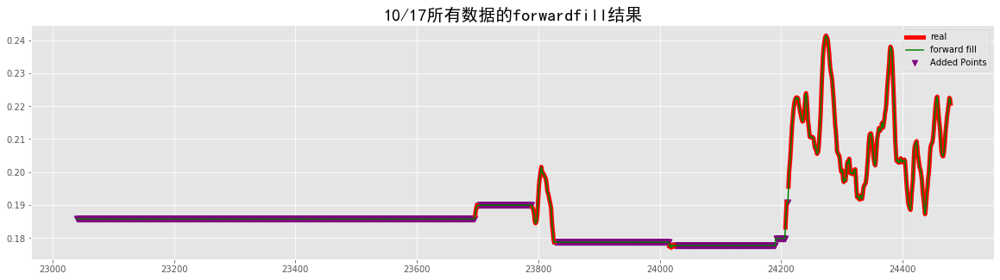

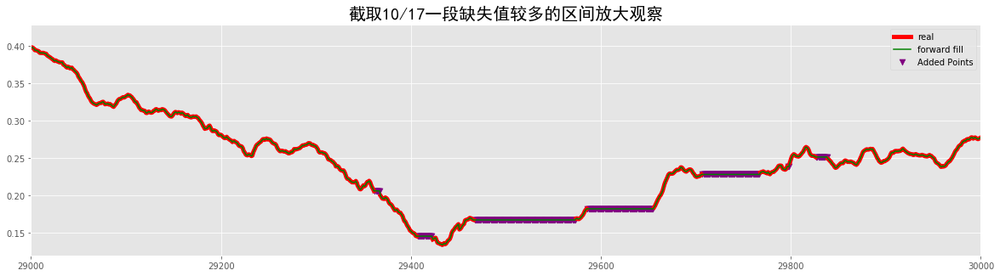

In [25]:
dfd17=df_new_avg[df_new_avg['day']==17]
dfd17
misindex17=[i for i in misindex if 16*1440<=i<=17*1440]
# print(misindex17)
plt.figure(figsize=(20,5))

# 真实值的散点及其连线 (蓝色)
# plt.scatter(dfd17.index,dfd17.avg_Speed,s=10,color='b')
plt.plot(dfd17.index,dfd17.avg_Speed,label='real',color='r',linewidth=5)

#加上fill之后的样子
# plt.scatter(dfd17[~dfd17.index.isin(misindex17)].index,dfd17[~dfd17.index.isin(misindex17)].f_fill_WindSpeed,s=5,c='r')
plt.scatter(dfd17.loc[misindex17].index,dfd17.loc[misindex17].f_fill_WindSpeed,s=50,c='purple',marker='v',label='Added Points')

# #全部填充满的样子（绿线）
plt.plot(dfd17.index,dfd17.f_fill_WindSpeed,label='forward fill',c='g')
# # # plt.figsize=(10,200)
plt.legend()
plt.title('10/17所有数据的forwardfill结果',fontproperties = 'SimHei',fontsize = 20)



dfd17=df_new_avg[df_new_avg['day']==21]
# dfd17=dfd17.iloc[29200:29800,:]
misindex17=[i for i in misindex if 20*1440<=i<=21*1440]
# print(misindex17)
plt.figure(figsize=(20,5))
plt.xlim(29000,30000)

# 真实值的散点及其连线 (蓝色)
# plt.scatter(dfd17.index,dfd17.avg_Speed,s=10,color='b')
plt.plot(dfd17.index,dfd17.avg_Speed,label='real',color='r',linewidth=5)

#加上fill之后的样子
# plt.scatter(dfd17[~dfd17.index.isin(misindex17)].index,dfd17[~dfd17.index.isin(misindex17)].f_fill_WindSpeed,s=5,c='r')
plt.scatter(dfd17.loc[misindex17].index,dfd17.loc[misindex17].f_fill_WindSpeed,s=50,c='purple',marker='v',label='Added Points')

# #全部填充满的样子（绿线）
plt.plot(dfd17.index,dfd17.f_fill_WindSpeed,label='forward fill',c='g')
# # # plt.figsize=(10,200)
plt.legend()
# plt.rcParams['font.family']='STsong'
plt.title('截取10/17一段缺失值较多的区间放大观察',fontproperties = 'SimHei',fontsize = 20)


#### 大段空缺不适合如此填充

### 2.4.4 Moving average填充缺失值效果观察

In [26]:
df101['moveavg']=np.where(df101['missing'].isnull(),
                             df101['missing'].shift(1).rolling(3,min_periods=1).mean(),
                             df101['missing'])

#### 利用一天（10/1）完整的数据，删除一些数据并用ForwardFill补上，拿补上的数据和真实数据做比较，看看填补效果

Text(0.5, 1.0, '选取10/1(数据完整),构造缺失点,利用MovingAverag填充并与真实值比较的结果')

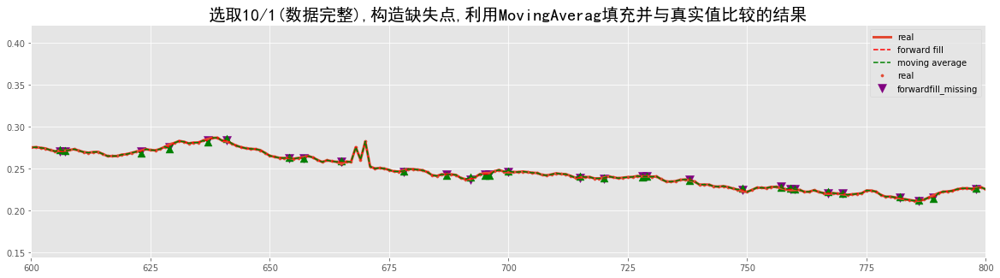

In [27]:
plt.figure(figsize=(20,5))
# 观察填充效果
plt.scatter(df101.index,df101.avg_Speed,s=10,label='real')
plt.plot(df101.index,df101.avg_Speed,label='real',linewidth=3)

# plt.scatter(df101[~df101.index.isin(mis_index)].index,df101[~df101.index.isin(mis_index)].f_fill,s=10,c='g',label='not_missing')

plt.scatter(df101.loc[mis_index].index,df101.loc[mis_index].f_fill,s=100,c='purple',marker='v',label='forwardfill_missing')

plt.plot(df101.index,df101.f_fill,label='forward fill',c='r',linestyle = '--')

# plt.scatter(unemploy[~unemploy.index.isin(mis_index)].year,unemploy[~unemploy.index.isin(mis_index)].moveavg,s=10,c='r')
plt.scatter(df101.loc[mis_index].index,df101.loc[mis_index].moveavg,s=80,c='g',marker='^')
plt.plot(df101.index,df101.moveavg,label='moving average',c='g',linestyle = '--')
plt.xlim(600,800)
plt.legend()
plt.title('选取10/1(数据完整),构造缺失点,利用MovingAverag填充并与真实值比较的结果',fontproperties = 'SimHei',fontsize = 20)


#### 由以上，发现零散缺失利用两种方法填补效果都很好，但大段缺失不适合填补。
#### 缺失值填补方法：
##### 若连续缺失数据少于30条（30min），就采取ForwardFill填补
#### 若连续缺失的数据大于30条，就令这一段数据空着不填充，未来也不输入模型（因为缺失大段的数据的简单填充的效果很不好，可能考虑未来使用一段类似的数据填充，也可以考虑未来使用模型预测然后填充上缺失的数据，但是这个要与之后的模型有关，在这里先不填充）

### 2.4.5 缺失值填充

#### 连续NAN少于30条，用移动平均法填补，生成`Fengdian_with30min_filled.csv `

In [29]:
df_new_avg=pd.read_csv('Fengdian_CleanAVG.csv')

miss = df_new_avg.isnull()
misindex=df_new_avg[miss.any(axis=1)==True].index.tolist()
print('填充之前，缺失值数量为：',len(misindex))
# print(misindex)

for i in misindex:
    now_index=misindex.index(i)
    if now_index==len(misindex)-1:
        df_new_avg.iloc[i,2]=df_new_avg.iloc[i-1,2]
        df_new_avg.iloc[i,3]=df_new_avg.iloc[i-1,3]
    else:
#         next_null_post=misindex[now_index+1]
#         print(i,next_null_post)
    
        flag=0
        for j in range(0,31):
            if i+j not in misindex:
#             print(j,'ok')
                df_new_avg.iloc[i,2]=df_new_avg.iloc[i-1,2]
                df_new_avg.iloc[i,3]=df_new_avg.iloc[i-1,3]
#             print(df_new_avg.iloc[i])
                flag=1
                break
            
        if flag==0:
            print(i,'link more than 30,dead_____________________')

# df_new_avg.to_csv('Fengdian_with30min_filled.csv',index=None)
#     if next_null_post-i
#     if misindex[now_index+1]
miss_newfilled30 = df_new_avg.isnull()
misindex_newfilled30=df_new_avg[miss_newfilled30.any(axis=1)==True].index.tolist()
print('在填充完缺失段小于30min的数据后，总缺失数据量为:',len(misindex_newfilled30))

填充之前，缺失值数量为： 7235
19642 link more than 30,dead_____________________
19643 link more than 30,dead_____________________
19644 link more than 30,dead_____________________
19645 link more than 30,dead_____________________
19646 link more than 30,dead_____________________
19647 link more than 30,dead_____________________
19648 link more than 30,dead_____________________
19649 link more than 30,dead_____________________
19650 link more than 30,dead_____________________
22515 link more than 30,dead_____________________
22516 link more than 30,dead_____________________
22517 link more than 30,dead_____________________
22518 link more than 30,dead_____________________
22519 link more than 30,dead_____________________
22520 link more than 30,dead_____________________
22521 link more than 30,dead_____________________
22522 link more than 30,dead_____________________
22523 link more than 30,dead_____________________
22524 link more than 30,dead_____________________
22525 link more than 30,dead____

22986 link more than 30,dead_____________________
22987 link more than 30,dead_____________________
22988 link more than 30,dead_____________________
22989 link more than 30,dead_____________________
22990 link more than 30,dead_____________________
22991 link more than 30,dead_____________________
22992 link more than 30,dead_____________________
22993 link more than 30,dead_____________________
22994 link more than 30,dead_____________________
22995 link more than 30,dead_____________________
22996 link more than 30,dead_____________________
22997 link more than 30,dead_____________________
22998 link more than 30,dead_____________________
22999 link more than 30,dead_____________________
23000 link more than 30,dead_____________________
23001 link more than 30,dead_____________________
23002 link more than 30,dead_____________________
23003 link more than 30,dead_____________________
23004 link more than 30,dead_____________________
23005 link more than 30,dead_____________________


23452 link more than 30,dead_____________________
23453 link more than 30,dead_____________________
23454 link more than 30,dead_____________________
23455 link more than 30,dead_____________________
23456 link more than 30,dead_____________________
23457 link more than 30,dead_____________________
23458 link more than 30,dead_____________________
23459 link more than 30,dead_____________________
23460 link more than 30,dead_____________________
23461 link more than 30,dead_____________________
23462 link more than 30,dead_____________________
23463 link more than 30,dead_____________________
23464 link more than 30,dead_____________________
23465 link more than 30,dead_____________________
23466 link more than 30,dead_____________________
23467 link more than 30,dead_____________________
23468 link more than 30,dead_____________________
23469 link more than 30,dead_____________________
23470 link more than 30,dead_____________________
23471 link more than 30,dead_____________________


23829 link more than 30,dead_____________________
23830 link more than 30,dead_____________________
23831 link more than 30,dead_____________________
23832 link more than 30,dead_____________________
23833 link more than 30,dead_____________________
23834 link more than 30,dead_____________________
23835 link more than 30,dead_____________________
23836 link more than 30,dead_____________________
23837 link more than 30,dead_____________________
23838 link more than 30,dead_____________________
23839 link more than 30,dead_____________________
23840 link more than 30,dead_____________________
23841 link more than 30,dead_____________________
23842 link more than 30,dead_____________________
23843 link more than 30,dead_____________________
23844 link more than 30,dead_____________________
23845 link more than 30,dead_____________________
23846 link more than 30,dead_____________________
23847 link more than 30,dead_____________________
23848 link more than 30,dead_____________________


24139 link more than 30,dead_____________________
24140 link more than 30,dead_____________________
24141 link more than 30,dead_____________________
24142 link more than 30,dead_____________________
24143 link more than 30,dead_____________________
24144 link more than 30,dead_____________________
24145 link more than 30,dead_____________________
24146 link more than 30,dead_____________________
24147 link more than 30,dead_____________________
24148 link more than 30,dead_____________________
24149 link more than 30,dead_____________________
24150 link more than 30,dead_____________________
24151 link more than 30,dead_____________________
24152 link more than 30,dead_____________________
24153 link more than 30,dead_____________________
24154 link more than 30,dead_____________________
24155 link more than 30,dead_____________________
24156 link more than 30,dead_____________________
24157 link more than 30,dead_____________________
24158 link more than 30,dead_____________________


26887 link more than 30,dead_____________________
26888 link more than 30,dead_____________________
26889 link more than 30,dead_____________________
26890 link more than 30,dead_____________________
26891 link more than 30,dead_____________________
26892 link more than 30,dead_____________________
26893 link more than 30,dead_____________________
26894 link more than 30,dead_____________________
26895 link more than 30,dead_____________________
26896 link more than 30,dead_____________________
26897 link more than 30,dead_____________________
26898 link more than 30,dead_____________________
26899 link more than 30,dead_____________________
26900 link more than 30,dead_____________________
26901 link more than 30,dead_____________________
26902 link more than 30,dead_____________________
26903 link more than 30,dead_____________________
26904 link more than 30,dead_____________________
26905 link more than 30,dead_____________________
26906 link more than 30,dead_____________________


29617 link more than 30,dead_____________________
29618 link more than 30,dead_____________________
29619 link more than 30,dead_____________________
29620 link more than 30,dead_____________________
29621 link more than 30,dead_____________________
29622 link more than 30,dead_____________________
29623 link more than 30,dead_____________________
29624 link more than 30,dead_____________________
29625 link more than 30,dead_____________________
29707 link more than 30,dead_____________________
29708 link more than 30,dead_____________________
29709 link more than 30,dead_____________________
29710 link more than 30,dead_____________________
29711 link more than 30,dead_____________________
29712 link more than 30,dead_____________________
29713 link more than 30,dead_____________________
29714 link more than 30,dead_____________________
29715 link more than 30,dead_____________________
29716 link more than 30,dead_____________________
29717 link more than 30,dead_____________________


34235 link more than 30,dead_____________________
34236 link more than 30,dead_____________________
34237 link more than 30,dead_____________________
34238 link more than 30,dead_____________________
34239 link more than 30,dead_____________________
34240 link more than 30,dead_____________________
34241 link more than 30,dead_____________________
34242 link more than 30,dead_____________________
34243 link more than 30,dead_____________________
34244 link more than 30,dead_____________________
34245 link more than 30,dead_____________________
34246 link more than 30,dead_____________________
34247 link more than 30,dead_____________________
34248 link more than 30,dead_____________________
34249 link more than 30,dead_____________________
34250 link more than 30,dead_____________________
34251 link more than 30,dead_____________________
34252 link more than 30,dead_____________________
34253 link more than 30,dead_____________________
34254 link more than 30,dead_____________________


34515 link more than 30,dead_____________________
34516 link more than 30,dead_____________________
34517 link more than 30,dead_____________________
34518 link more than 30,dead_____________________
34519 link more than 30,dead_____________________
34520 link more than 30,dead_____________________
34521 link more than 30,dead_____________________
34522 link more than 30,dead_____________________
34523 link more than 30,dead_____________________
34524 link more than 30,dead_____________________
34525 link more than 30,dead_____________________
34526 link more than 30,dead_____________________
34527 link more than 30,dead_____________________
34528 link more than 30,dead_____________________
34529 link more than 30,dead_____________________
34530 link more than 30,dead_____________________
34531 link more than 30,dead_____________________
34532 link more than 30,dead_____________________
34533 link more than 30,dead_____________________
34534 link more than 30,dead_____________________


34816 link more than 30,dead_____________________
34817 link more than 30,dead_____________________
34818 link more than 30,dead_____________________
34819 link more than 30,dead_____________________
34820 link more than 30,dead_____________________
34821 link more than 30,dead_____________________
34822 link more than 30,dead_____________________
34823 link more than 30,dead_____________________
34824 link more than 30,dead_____________________
34825 link more than 30,dead_____________________
34826 link more than 30,dead_____________________
34827 link more than 30,dead_____________________
34828 link more than 30,dead_____________________
34829 link more than 30,dead_____________________
34830 link more than 30,dead_____________________
34831 link more than 30,dead_____________________
34832 link more than 30,dead_____________________
34833 link more than 30,dead_____________________
34834 link more than 30,dead_____________________
34835 link more than 30,dead_____________________


35086 link more than 30,dead_____________________
35087 link more than 30,dead_____________________
35088 link more than 30,dead_____________________
35089 link more than 30,dead_____________________
35090 link more than 30,dead_____________________
35091 link more than 30,dead_____________________
35092 link more than 30,dead_____________________
35093 link more than 30,dead_____________________
35094 link more than 30,dead_____________________
35095 link more than 30,dead_____________________
35096 link more than 30,dead_____________________
35097 link more than 30,dead_____________________
35098 link more than 30,dead_____________________
35099 link more than 30,dead_____________________
35100 link more than 30,dead_____________________
35101 link more than 30,dead_____________________
35102 link more than 30,dead_____________________
35103 link more than 30,dead_____________________
35104 link more than 30,dead_____________________
35105 link more than 30,dead_____________________


35342 link more than 30,dead_____________________
35343 link more than 30,dead_____________________
35344 link more than 30,dead_____________________
35345 link more than 30,dead_____________________
35346 link more than 30,dead_____________________
35347 link more than 30,dead_____________________
35348 link more than 30,dead_____________________
35349 link more than 30,dead_____________________
35350 link more than 30,dead_____________________
35351 link more than 30,dead_____________________
35352 link more than 30,dead_____________________
35353 link more than 30,dead_____________________
35354 link more than 30,dead_____________________
35355 link more than 30,dead_____________________
35356 link more than 30,dead_____________________
35357 link more than 30,dead_____________________
35358 link more than 30,dead_____________________
35359 link more than 30,dead_____________________
35360 link more than 30,dead_____________________
35361 link more than 30,dead_____________________


35567 link more than 30,dead_____________________
35568 link more than 30,dead_____________________
35569 link more than 30,dead_____________________
35570 link more than 30,dead_____________________
35571 link more than 30,dead_____________________
35572 link more than 30,dead_____________________
35573 link more than 30,dead_____________________
35574 link more than 30,dead_____________________
35575 link more than 30,dead_____________________
35576 link more than 30,dead_____________________
35577 link more than 30,dead_____________________
35578 link more than 30,dead_____________________
35579 link more than 30,dead_____________________
35580 link more than 30,dead_____________________
35581 link more than 30,dead_____________________
35582 link more than 30,dead_____________________
35583 link more than 30,dead_____________________
35584 link more than 30,dead_____________________
35585 link more than 30,dead_____________________
35586 link more than 30,dead_____________________


35833 link more than 30,dead_____________________
35834 link more than 30,dead_____________________
35835 link more than 30,dead_____________________
35836 link more than 30,dead_____________________
35837 link more than 30,dead_____________________
35838 link more than 30,dead_____________________
35839 link more than 30,dead_____________________
35840 link more than 30,dead_____________________
35841 link more than 30,dead_____________________
35842 link more than 30,dead_____________________
35843 link more than 30,dead_____________________
35844 link more than 30,dead_____________________
35845 link more than 30,dead_____________________
35846 link more than 30,dead_____________________
35847 link more than 30,dead_____________________
35848 link more than 30,dead_____________________
35849 link more than 30,dead_____________________
35850 link more than 30,dead_____________________
35851 link more than 30,dead_____________________
35852 link more than 30,dead_____________________


36044 link more than 30,dead_____________________
36045 link more than 30,dead_____________________
36046 link more than 30,dead_____________________
36047 link more than 30,dead_____________________
36048 link more than 30,dead_____________________
36049 link more than 30,dead_____________________
36050 link more than 30,dead_____________________
36051 link more than 30,dead_____________________
36052 link more than 30,dead_____________________
36053 link more than 30,dead_____________________
36054 link more than 30,dead_____________________
36055 link more than 30,dead_____________________
36056 link more than 30,dead_____________________
36057 link more than 30,dead_____________________
36058 link more than 30,dead_____________________
36059 link more than 30,dead_____________________
36060 link more than 30,dead_____________________
36061 link more than 30,dead_____________________
36062 link more than 30,dead_____________________
36063 link more than 30,dead_____________________


36283 link more than 30,dead_____________________
36284 link more than 30,dead_____________________
36285 link more than 30,dead_____________________
36286 link more than 30,dead_____________________
36287 link more than 30,dead_____________________
36288 link more than 30,dead_____________________
36289 link more than 30,dead_____________________
36290 link more than 30,dead_____________________
36291 link more than 30,dead_____________________
36292 link more than 30,dead_____________________
36293 link more than 30,dead_____________________
36294 link more than 30,dead_____________________
36295 link more than 30,dead_____________________
36296 link more than 30,dead_____________________
36297 link more than 30,dead_____________________
36298 link more than 30,dead_____________________
36299 link more than 30,dead_____________________
36300 link more than 30,dead_____________________
36301 link more than 30,dead_____________________
36302 link more than 30,dead_____________________


36480 link more than 30,dead_____________________
36481 link more than 30,dead_____________________
36482 link more than 30,dead_____________________
36483 link more than 30,dead_____________________
36484 link more than 30,dead_____________________
36485 link more than 30,dead_____________________
36486 link more than 30,dead_____________________
36487 link more than 30,dead_____________________
36488 link more than 30,dead_____________________
36489 link more than 30,dead_____________________
36490 link more than 30,dead_____________________
36491 link more than 30,dead_____________________
36492 link more than 30,dead_____________________
36493 link more than 30,dead_____________________
36494 link more than 30,dead_____________________
36495 link more than 30,dead_____________________
36496 link more than 30,dead_____________________
36497 link more than 30,dead_____________________
36498 link more than 30,dead_____________________
36499 link more than 30,dead_____________________


36739 link more than 30,dead_____________________
36740 link more than 30,dead_____________________
36741 link more than 30,dead_____________________
36742 link more than 30,dead_____________________
36743 link more than 30,dead_____________________
36744 link more than 30,dead_____________________
36745 link more than 30,dead_____________________
36746 link more than 30,dead_____________________
36747 link more than 30,dead_____________________
36748 link more than 30,dead_____________________
36749 link more than 30,dead_____________________
36750 link more than 30,dead_____________________
36751 link more than 30,dead_____________________
36752 link more than 30,dead_____________________
36753 link more than 30,dead_____________________
36754 link more than 30,dead_____________________
36755 link more than 30,dead_____________________
36756 link more than 30,dead_____________________
36757 link more than 30,dead_____________________
36758 link more than 30,dead_____________________


36967 link more than 30,dead_____________________
36968 link more than 30,dead_____________________
36969 link more than 30,dead_____________________
36970 link more than 30,dead_____________________
36971 link more than 30,dead_____________________
36972 link more than 30,dead_____________________
36973 link more than 30,dead_____________________
36974 link more than 30,dead_____________________
36975 link more than 30,dead_____________________
36976 link more than 30,dead_____________________
36977 link more than 30,dead_____________________
36978 link more than 30,dead_____________________
36979 link more than 30,dead_____________________
36980 link more than 30,dead_____________________
36981 link more than 30,dead_____________________
36982 link more than 30,dead_____________________
36983 link more than 30,dead_____________________
36984 link more than 30,dead_____________________
36985 link more than 30,dead_____________________
36986 link more than 30,dead_____________________


37180 link more than 30,dead_____________________
37181 link more than 30,dead_____________________
37182 link more than 30,dead_____________________
37183 link more than 30,dead_____________________
37184 link more than 30,dead_____________________
37185 link more than 30,dead_____________________
37186 link more than 30,dead_____________________
37187 link more than 30,dead_____________________
37188 link more than 30,dead_____________________
37189 link more than 30,dead_____________________
37190 link more than 30,dead_____________________
37191 link more than 30,dead_____________________
37192 link more than 30,dead_____________________
37193 link more than 30,dead_____________________
37194 link more than 30,dead_____________________
37195 link more than 30,dead_____________________
37196 link more than 30,dead_____________________
37197 link more than 30,dead_____________________
37198 link more than 30,dead_____________________
37199 link more than 30,dead_____________________


37401 link more than 30,dead_____________________
37402 link more than 30,dead_____________________
37403 link more than 30,dead_____________________
37404 link more than 30,dead_____________________
37405 link more than 30,dead_____________________
37406 link more than 30,dead_____________________
37407 link more than 30,dead_____________________
37408 link more than 30,dead_____________________
37409 link more than 30,dead_____________________
37410 link more than 30,dead_____________________
37411 link more than 30,dead_____________________
37412 link more than 30,dead_____________________
37413 link more than 30,dead_____________________
37414 link more than 30,dead_____________________
37415 link more than 30,dead_____________________
37416 link more than 30,dead_____________________
37417 link more than 30,dead_____________________
37418 link more than 30,dead_____________________
37419 link more than 30,dead_____________________
37420 link more than 30,dead_____________________


37608 link more than 30,dead_____________________
37609 link more than 30,dead_____________________
37610 link more than 30,dead_____________________
37611 link more than 30,dead_____________________
37612 link more than 30,dead_____________________
37613 link more than 30,dead_____________________
37614 link more than 30,dead_____________________
37615 link more than 30,dead_____________________
37616 link more than 30,dead_____________________
37617 link more than 30,dead_____________________
37618 link more than 30,dead_____________________
37619 link more than 30,dead_____________________
37620 link more than 30,dead_____________________
37621 link more than 30,dead_____________________
37622 link more than 30,dead_____________________
37623 link more than 30,dead_____________________
37624 link more than 30,dead_____________________
37625 link more than 30,dead_____________________
37626 link more than 30,dead_____________________
37627 link more than 30,dead_____________________


37855 link more than 30,dead_____________________
37856 link more than 30,dead_____________________
37857 link more than 30,dead_____________________
37858 link more than 30,dead_____________________
37859 link more than 30,dead_____________________
37860 link more than 30,dead_____________________
37861 link more than 30,dead_____________________
37862 link more than 30,dead_____________________
37863 link more than 30,dead_____________________
37864 link more than 30,dead_____________________
37865 link more than 30,dead_____________________
37866 link more than 30,dead_____________________
37867 link more than 30,dead_____________________
37868 link more than 30,dead_____________________
37869 link more than 30,dead_____________________
37870 link more than 30,dead_____________________
37871 link more than 30,dead_____________________
37872 link more than 30,dead_____________________
37873 link more than 30,dead_____________________
37874 link more than 30,dead_____________________


39523 link more than 30,dead_____________________
39524 link more than 30,dead_____________________
39525 link more than 30,dead_____________________
39526 link more than 30,dead_____________________
39527 link more than 30,dead_____________________
39528 link more than 30,dead_____________________
39529 link more than 30,dead_____________________
39530 link more than 30,dead_____________________
39531 link more than 30,dead_____________________
39532 link more than 30,dead_____________________
39533 link more than 30,dead_____________________
39534 link more than 30,dead_____________________
39535 link more than 30,dead_____________________
39536 link more than 30,dead_____________________
39537 link more than 30,dead_____________________
39538 link more than 30,dead_____________________
39539 link more than 30,dead_____________________
39540 link more than 30,dead_____________________
39541 link more than 30,dead_____________________
39542 link more than 30,dead_____________________


39708 link more than 30,dead_____________________
39709 link more than 30,dead_____________________
39710 link more than 30,dead_____________________
39711 link more than 30,dead_____________________
39712 link more than 30,dead_____________________
39713 link more than 30,dead_____________________
39714 link more than 30,dead_____________________
39715 link more than 30,dead_____________________
39716 link more than 30,dead_____________________
39717 link more than 30,dead_____________________
39718 link more than 30,dead_____________________
39719 link more than 30,dead_____________________
39720 link more than 30,dead_____________________
39721 link more than 30,dead_____________________
39722 link more than 30,dead_____________________
39723 link more than 30,dead_____________________
39724 link more than 30,dead_____________________
39725 link more than 30,dead_____________________
39726 link more than 30,dead_____________________
39727 link more than 30,dead_____________________


39917 link more than 30,dead_____________________
39918 link more than 30,dead_____________________
39919 link more than 30,dead_____________________
39920 link more than 30,dead_____________________
39921 link more than 30,dead_____________________
39922 link more than 30,dead_____________________
39923 link more than 30,dead_____________________
39924 link more than 30,dead_____________________
39925 link more than 30,dead_____________________
39926 link more than 30,dead_____________________
39927 link more than 30,dead_____________________
39928 link more than 30,dead_____________________
39929 link more than 30,dead_____________________
39930 link more than 30,dead_____________________
在填充完缺失段小于30min的数据后，总缺失数据量为: 6919


#### 在ForwardFill了缺失段小于30min的数据之后，总缺失量从7235变成了6919，其中还包括25和26号两天一个数据都没有。
#### 如果不管这两天，那缺失值就又会减少到6919-1440*2=4039
#### 画图比较fill30后与original缺失值数量的差异

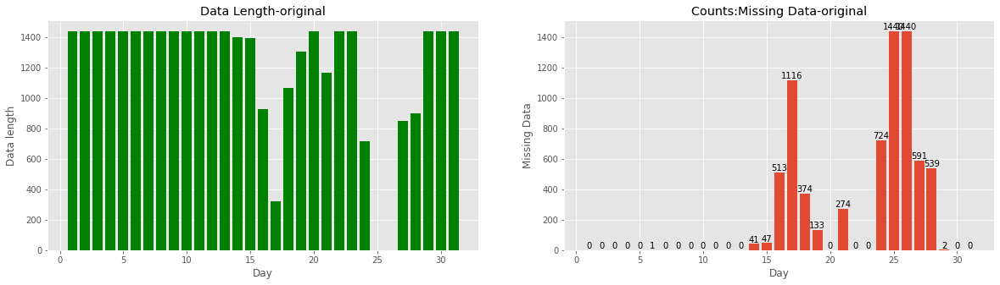

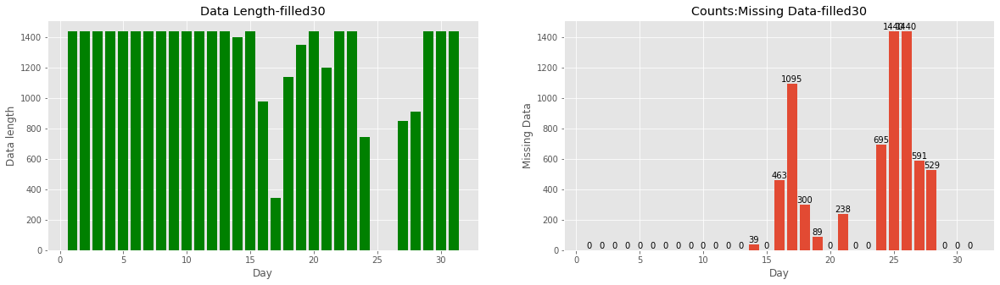

In [30]:
#填补之前
df_new_avg=pd.read_csv('Fengdian_AVG.csv')
draw_missing_counts(df_new_avg,'Data Length-original','Counts:Missing Data-original')
#填补之后
df_filled30=pd.read_csv('Fengdian_with30min_filled.csv')
draw_missing_counts(df_filled30,'Data Length-filled30','Counts:Missing Data-filled30')


## 2.5 平滑数据

### 2.5.1 平稳性检验

#### 2.5.1.1 ADF Test
p>0.05，故序列平稳

In [31]:
df_orig =pd.read_csv('Fengdian_with30min_filled.csv')
df_full= df_orig.query('day<=13')
# ADF test
result = adfuller(df_full['avg_Speed'], autolag='AIC')

print('*' * 50)
print(f"ADF Statistic of speed: {result[0]}; p-value: {result[1]}")

for key, value in result[4].items():
    print('Crital Values:')
    print(f"{key}, {value}")

result = adfuller(df_full['avg_Power'], autolag='AIC')

print('*' * 50)
print(f"ADF Statistic of Power: {result[0]}; p-value: {result[1]}")

for key, value in result[4].items():
    print('Crital Values:')
    print(f"{key}, {value}")

**************************************************
ADF Statistic of speed: -2.156373243644567; p-value: 0.22245854612670973
Crital Values:
1%, -3.430699593622523
Crital Values:
5%, -2.8616945075066655
Crital Values:
10%, -2.5668522402260887
**************************************************
ADF Statistic of Power: -2.44921142239032; p-value: 0.1283256264396535
Crital Values:
1%, -3.4307002302198053
Crital Values:
5%, -2.861694788842625
Crital Values:
10%, -2.566852389976601


#### 2.5.1.2 KPSS Test
p<0.05，故平稳

In [32]:
result = kpss(df_full['avg_Speed'], regression='c', nlags='auto')

print('*' * 50)
print(f'\nKPSS Stattistic of Speed: {result[0]:.10f}; p-value: {result[1]:.3f}')

for key, value in result[3].items():
    print('Crital Values:')
    print(f"{key}, {value}")

result = kpss(df_full['avg_Power'], regression='c', nlags='auto')

print('*' * 50)
print(f'\nKPSS Stattistic of Power: {result[0]:.10f}; p-value: {result[1]:.3f}')

for key, value in result[3].items():
    print('Crital Values:')
    print(f"{key}, {value}")

**************************************************

KPSS Stattistic of Speed: 6.5581799605; p-value: 0.010
Crital Values:
10%, 0.347
Crital Values:
5%, 0.463
Crital Values:
2.5%, 0.574
Crital Values:
1%, 0.739
**************************************************

KPSS Stattistic of Power: 5.0830161736; p-value: 0.010
Crital Values:
10%, 0.347
Crital Values:
5%, 0.463
Crital Values:
2.5%, 0.574
Crital Values:
1%, 0.739


C:\Users\24496\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2019: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warn_msg.format(direction="smaller"), InterpolationWarning
C:\Users\24496\Anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:2019: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warn_msg.format(direction="smaller"), InterpolationWarning


### 2.5.2 白噪声检验
p<0.05，不是白噪声

In [33]:
# Ljung-Box Test
result = ljbox(df_full['avg_Speed'], lags=1)
print(f'Ljung-Box Test of Speed: \n')
print(result,' \n')
result = ljbox(df_full['avg_Power'], lags=1)
print(f'Ljung-Box Test of Power \n')
print(result)

Ljung-Box Test of Speed: 

        lb_stat  lb_pvalue
1  18717.570669        0.0  

Ljung-Box Test of Power 

        lb_stat  lb_pvalue
1  18697.207175        0.0


### 2.5.3 移动平均平滑的效果

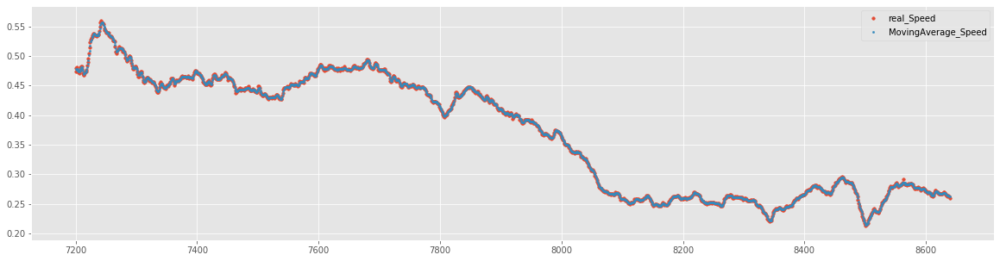

In [34]:
df_orig =pd.read_csv('Fengdian_with30min_filled.csv')
df_orig=df_orig.query('day == 6')
y=df_orig['avg_Speed']
y=y.dropna()

df_ma = y.rolling(3, center=True, closed='both').mean()
plt.figure(figsize=(20,5))
plt.scatter(y.index,y,label='real_Speed',s=13)
plt.scatter(y.index,df_ma,label='MovingAverage_Speed',s=5)
# plt.xlim(1440,2990)
plt.legend()

### 2.5.4 Loess平滑 
#### 看一下每天平滑得到的结果，发现结果较好

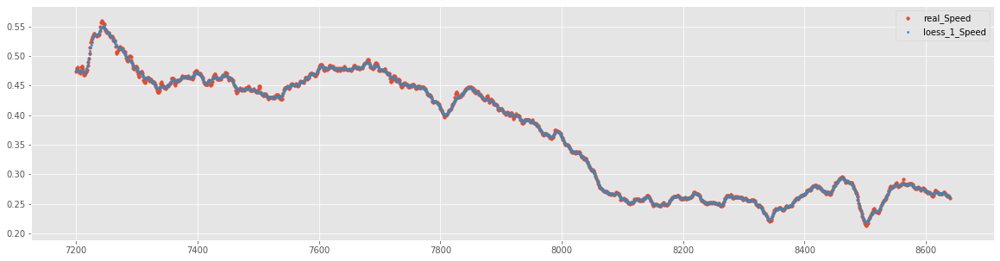

In [35]:
df_orig =pd.read_csv('Fengdian_with30min_filled.csv')

df_orig=df_orig.query('day == 6')
y=df_orig['avg_Speed']

y=y.dropna()
df_loess_1 = lowess(y,y.index,frac=0.01)[:,1]
plt.figure(figsize=(20,5))
plt.scatter(y.index,y,label='real_Speed',s=13)
plt.scatter(y.index,df_loess_1,label='loess_1_Speed',s=5)
# plt.xlim(1440,2990)
plt.legend()


### 2.5.5 最终选用 Loess平滑
#### 每天分别Loess平滑，然后拼接成完整的`Fengdian_after_smoothing.csv`

In [36]:
# 导入数据
df_orig_all =pd.read_csv('Fengdian_with30min_filled.csv')
df_orig_all['loess_1_Speed']=None
df_orig_all['loess_1_Power']=None
for i in range(1,32):
    df_orig=df_orig_all.query('day == %i'%i)    
    y_orig=df_orig['avg_Speed']
    y_orig_2=df_orig['avg_Power']
    y=y_orig.dropna()
    y2=y_orig_2.dropna()

    df_loess_1 = lowess(y,y.index,frac=0.01)[:,1]
    df_loess_2 = lowess(y2,y.index,frac=0.01)[:,1]
    yindexlist=y.index.tolist()
#     print(len(df_loess_2),len(df_loess_1))
    for i in range(len(df_loess_1)):
        df_orig_all.iloc[yindexlist[i],5]=df_loess_1[i]
        df_orig_all.iloc[yindexlist[i],6]=df_loess_2[i]

# df_orig_all.to_csv('Fengdian_after_smoothing.csv',index=False)

### 2.5.6 看一下平滑后的31天整体效果

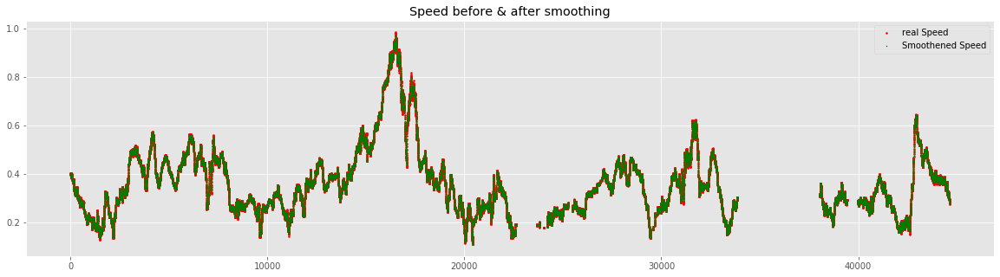

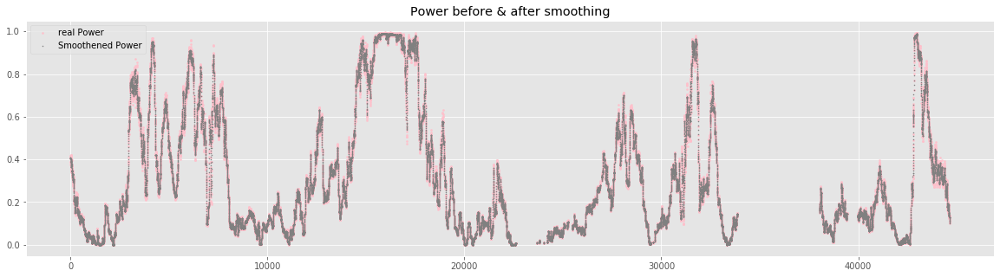

In [37]:
df_after_smoothing=pd.read_csv('Fengdian_after_smoothing.csv')
plt.figure(figsize=(20,5))
plt.scatter(df_after_smoothing.index,df_after_smoothing.avg_Speed,s=4,c='r',label='real Speed')
plt.scatter(df_after_smoothing.index,df_after_smoothing.loess_1_Speed,s=1,c='g',label='Smoothened Speed')
plt.title('Speed before & after smoothing')
plt.legend()

plt.figure(figsize=(20,5))
plt.scatter(df_after_smoothing.index,df_after_smoothing.avg_Power,s=4,c='pink',label='real Power')
plt.scatter(df_after_smoothing.index,df_after_smoothing.loess_1_Power,s=1,c='grey',label='Smoothened Power')
plt.title('Power before & after smoothing')
plt.legend()



# 3 预处理后数据特性可视化

## 3.1 数据随时间变化

### 3.1.1 31天Power和Speed随时间的变化

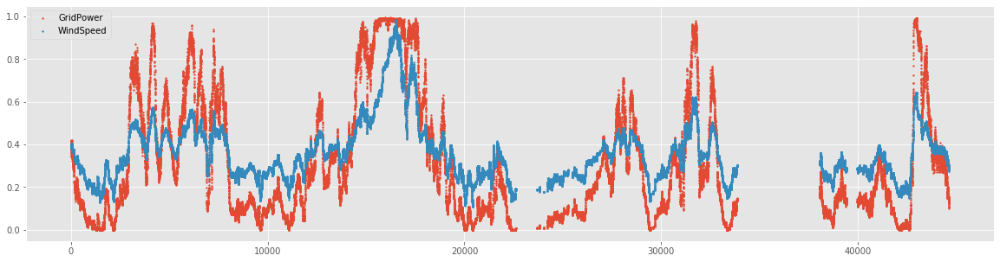

In [38]:
df_new_avg=pd.read_csv('Fengdian_AVG.csv')
df_new_avg.index
fig = plt.figure(figsize=(20, 5))
plt.scatter(df_new_avg.index, df_new_avg['avg_Power'], s=3, label='GridPower')
plt.scatter(df_new_avg.index, df_new_avg['avg_Speed'], s=3, label='WindSpeed')
plt.legend()

### 3.1.2 GridPower随时间变化（每日）

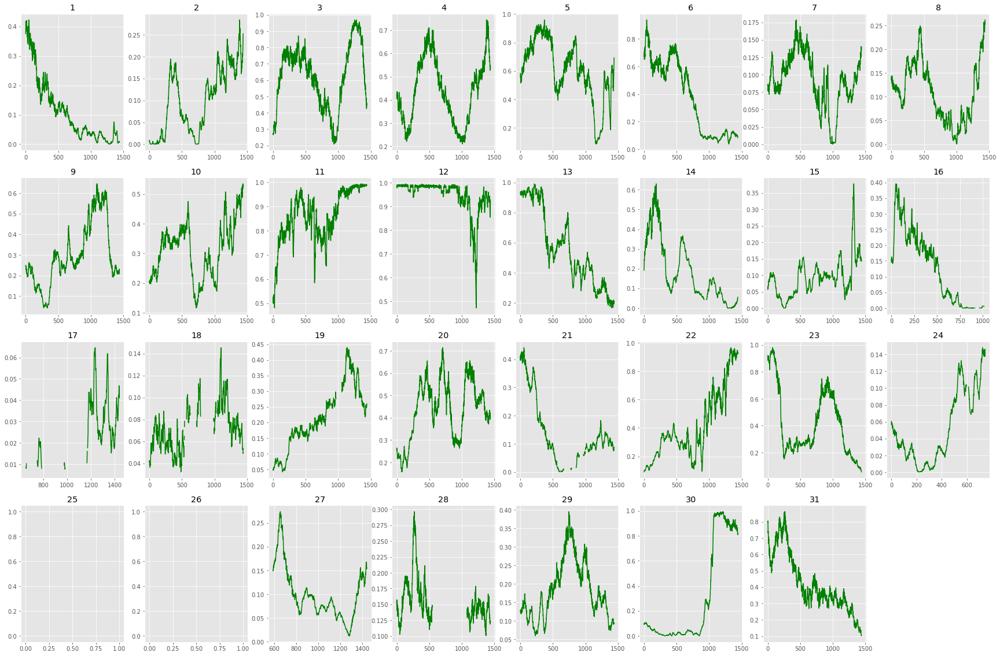

In [39]:
plt.figure(figsize=(30, 20))
for i in range(1,32):
    day_data=df_new_avg[df_new_avg['day']==i]    
    day_data.reset_index(drop=True, inplace=True) 
    plt.subplot(4,8,i).set_title(i)
    plt.plot(day_data.index,day_data['avg_Power'],color='g')
plt.show()

### 3.1.3 WindSpeed随时间变化（每日）

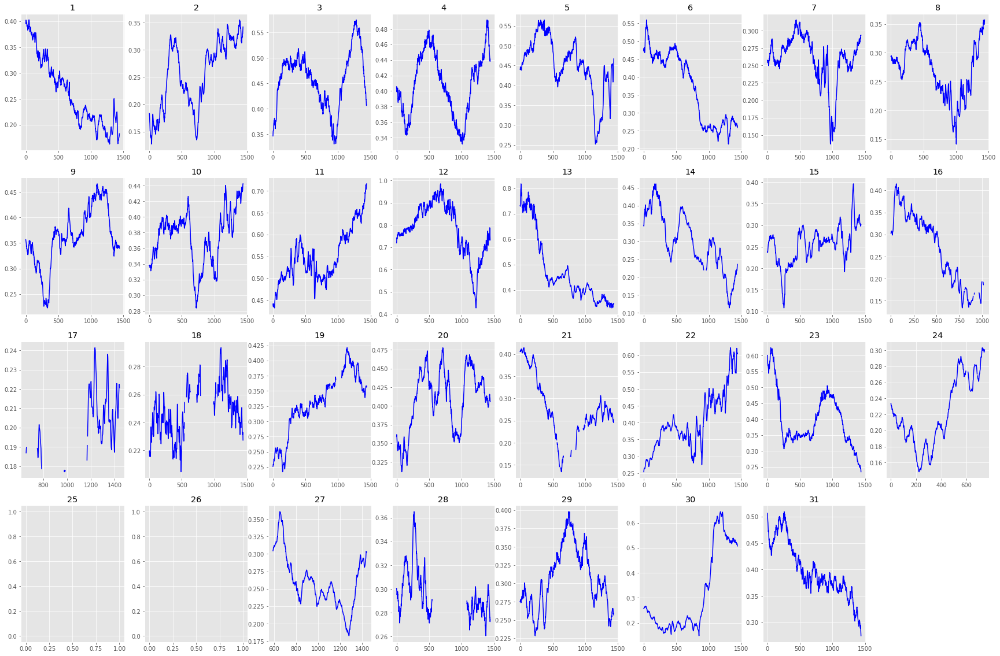

In [40]:
plt.figure(figsize=(30, 20))
for i in range(1,32):
    day_data=df_new_avg[df_new_avg['day']==i]    
    day_data.reset_index(drop=True, inplace=True) 
    plt.subplot(4,8,i).set_title(i)
    plt.plot(day_data.index,day_data['avg_Speed'],color='b')
plt.show()

### 3.1.4 WindSpeed和GridPower随时间变化（画在一张图里）
风速和功率变化趋势很像

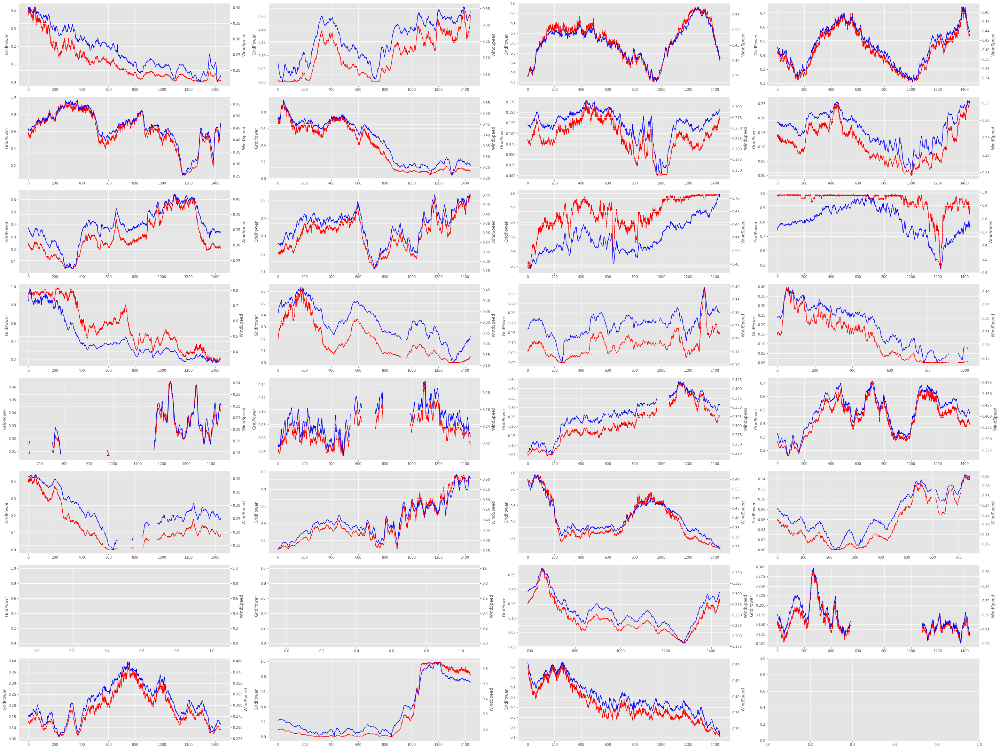

In [41]:
fig,ax=plt.subplots(nrows=8,ncols=4,figsize=(40, 30))
ax=ax.flatten()
for i in range(0,31):
    day_data= df_new_avg[df_new_avg['day']==i+1]    
    day_data.reset_index(drop=True, inplace=True) 
#     x = [i for i in range(2880)]
    y_GP = day_data['avg_Power']
    y_Wind_Spd = day_data['avg_Speed']
    ax[i].plot(day_data.index,y_GP,color='r', label="GridPower")
    ax[i].set_ylabel('GridPower')
    ax01=ax[i].twinx()
    ax01.plot(day_data.index,y_Wind_Spd,color='b', label="WindSpeed")
    ax01.set_ylabel('WindSpeed')
plt.tight_layout()
plt.show()

## 3.2 相关性探索

### 3.2.1 WindSpeed与GridPower相关性探索

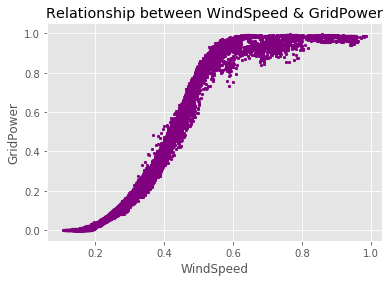

In [42]:
plt.style.use('ggplot')
plt.scatter(x=df_new_avg['avg_Speed'], y=df_new_avg['avg_Power'], s=5,c='purple', marker='x')
plt.xlabel('WindSpeed')
plt.ylabel('GridPower')
plt.title('Relationship between WindSpeed & GridPower')
plt.show()

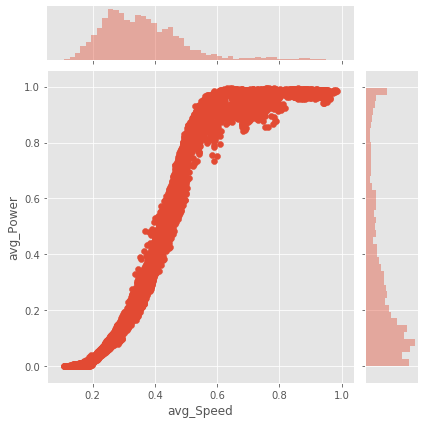

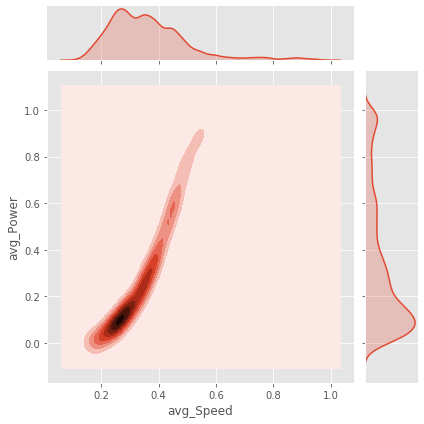

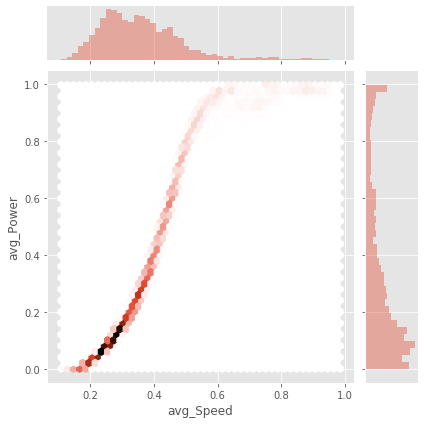

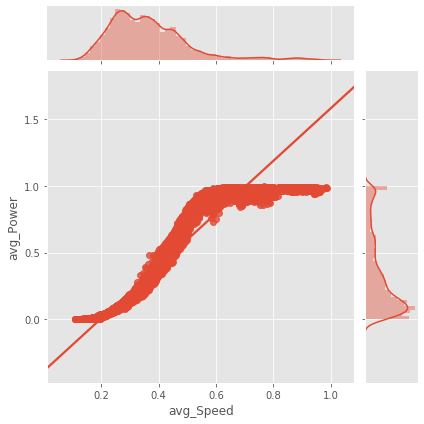

In [43]:
sns.jointplot(x = df_new_avg['avg_Speed'], y = df_new_avg['avg_Power'])
sns.jointplot(x = df_new_avg['avg_Speed'], y = df_new_avg['avg_Power'],kind = 'kde')
sns.jointplot(x = df_new_avg['avg_Speed'], y = df_new_avg['avg_Power'],kind = 'hex')
sns.jointplot(x = df_new_avg['avg_Speed'], y = df_new_avg['avg_Power'],kind = 'reg')


### 3.2.2 WindSpeed及GridPower与Time相关性探索

Text(0.5, 1.0, 'Relationship between GridPower & Time')

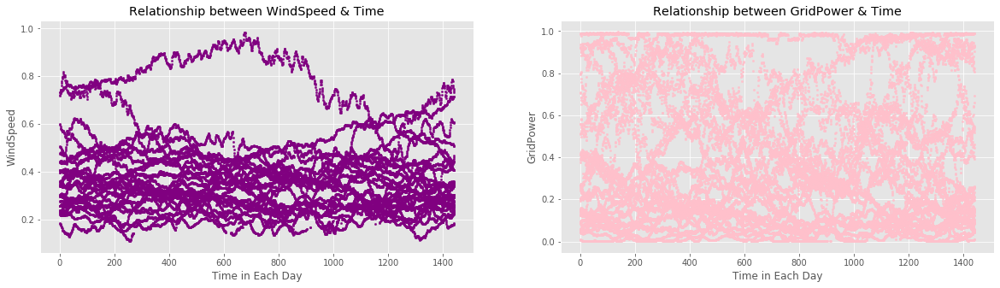

In [44]:
fig,ax=plt.subplots(1,2,figsize=(20,5))

ax[0].scatter(x=df_new_avg['TimeinDay'],y=df_new_avg['avg_Speed'], s=5,c='purple', marker='o')
ax[0].set_xlabel('Time in Each Day')
ax[0].set_ylabel('WindSpeed')
ax[0].set_title('Relationship between WindSpeed & Time')

ax[1].scatter(x=df_new_avg['TimeinDay'],y=df_new_avg['avg_Power'], s=5,c='pink', marker='o')
ax[1].set_xlabel('Time in Each Day')
ax[1].set_ylabel('GridPower')
ax[1].set_title('Relationship between GridPower & Time')


### 3.3.3 相关性系数及热力图  

In [45]:
dfcorr=df_new_avg[['day','TimeinDay','avg_Speed','avg_Power']]
dfcorr
corr=dfcorr.corr()
print(corr)

                    day     TimeinDay  avg_Speed  avg_Power
day        1.000000e+00  6.357671e-15  -0.107433  -0.120550
TimeinDay  6.357671e-15  1.000000e+00  -0.040939  -0.029232
avg_Speed -1.074326e-01 -4.093863e-02   1.000000   0.945846
avg_Power -1.205504e-01 -2.923184e-02   0.945846   1.000000


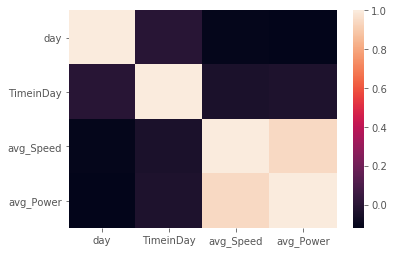

In [46]:
heatmap=sns.heatmap(corr)
plt.show()

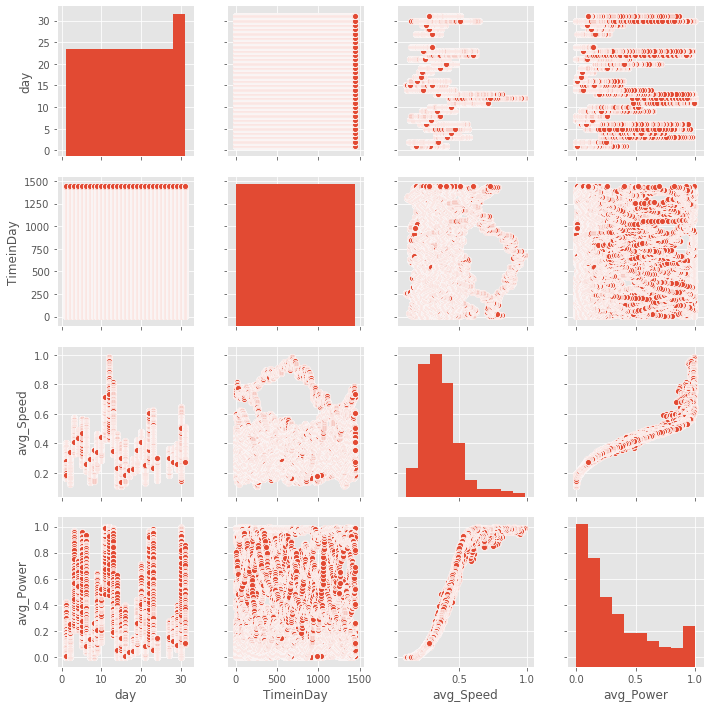

In [47]:
sns.pairplot(dfcorr)


# 4 特征提取


## 4.1 提取统计量特征

In [48]:
data =pd.read_csv('Fengdian_with30min_filled.csv')
delta_t=1


#相比上一分钟和五分钟pct_change
data['Power_pct_change_1min']=data['avg_Power'].pct_change(periods=delta_t)
data['Speed_pct_change_1min']=data['avg_Speed'].pct_change(periods=delta_t)
data['Power_pct_change_5min']=data['avg_Power'].pct_change(periods=5)
data['Speed_pct_change_5min']=data['avg_Speed'].pct_change(periods=5)


#该时间点的前5min的数据的均值
def get_df1to5(columnname):
    df1=data[columnname].shift(1)
# data['df1']=df1.copy()
    df2=data[columnname].shift(2)
# data['df2']=df1.copy()
    df3=data[columnname].shift(3)
# data['df3']=df1.copy()
    df4=data[columnname].shift(4)
# data['df4']=df1.copy()
    df5=data[columnname].shift(5)
    return df1,df2,df3,df4,df5

def get_mean(df1,df2,df3,df4,df5):
    a=[]
    a=pd.DataFrame(a)
    a['df1']=df1.copy()
    a['df2']=df2.copy()
    a['df3']=df3.copy()
    a['df4']=df4.copy()
    a['df5']=df5.copy()
    mean=a.mean(1)
    #print(mean)
    return mean

df1,df2,df3,df4,df5=get_df1to5('avg_Speed')
mean_5min_Speed=get_mean(df1,df2,df3,df4,df5)
data['Speed_mean_5min']=mean_5min_Speed.copy()  

df1,df2,df3,df4,df5=get_df1to5('avg_Power')
mean_5min_Power=get_mean(df1,df2,df3,df4,df5)
data['Power_mean_5min']=mean_5min_Power.copy() 


#该时间点前5min的std
def get_std(df1,df2,df3,df4,df5):
    a=[]
    a=pd.DataFrame(a)
    a['df1']=df1.copy()
    a['df2']=df2.copy()
    a['df3']=df3.copy()
    a['df4']=df4.copy()
    a['df5']=df5.copy()
    std=a.std(1)
    #print(mean)
    return std

df1,df2,df3,df4,df5=get_df1to5('avg_Speed')
std_5min_Speed=get_std(df1,df2,df3,df4,df5)
data['Speed_std_5min']=std_5min_Speed.copy()  

df1,df2,df3,df4,df5=get_df1to5('avg_Power')
std_5min_Power=get_std(df1,df2,df3,df4,df5)
data['Power_std_5min']=std_5min_Power.copy() 



##该时间点前5min的max
def get_max5min(columnname,newname):
    df1,df2,df3,df4,df5=get_df1to5(columnname)
    a=[]
    a=pd.DataFrame(a)
    a['df1']=df1.copy()
    a['df2']=df2.copy()
    a['df3']=df3.copy()
    a['df4']=df4.copy()
    a['df5']=df5.copy()
    a=a.assign(newname=a[['df1','df2','df3','df4','df5']].apply(max,axis=1))
    return a
a=get_max5min('avg_Speed','Speed_max_5min')
data['Speed_max_5min']=a['newname'].copy()
b=get_max5min('avg_Power','Power_max_5min')
data['Power_max_5min']=b['newname'].copy()

#该时间点前5min的min
def get_min5min(columnname,newname):
    df1,df2,df3,df4,df5=get_df1to5(columnname)
    a=[]
    a=pd.DataFrame(a)
    a['df1']=df1.copy()
    a['df2']=df2.copy()
    a['df3']=df3.copy()
    a['df4']=df4.copy()
    a['df5']=df5.copy()
    a=a.assign(newname=a[['df1','df2','df3','df4','df5']].apply(min,axis=1))
    return a
a=get_min5min('avg_Speed','Speed_min_5min')
data['Speed_min_5min']=a['newname'].copy()
b=get_min5min('avg_Power','Power_min_5min')
data['Power_min_5min']=b['newname'].copy()



#corr,skew,diff
window_length=5
speed_roller = data['avg_Speed'].rolling(window = window_length)
data['Speed_corr'] = speed_roller.corr().shift(1)
data['Speed_skew'] = speed_roller.skew().shift(1)
data['Speed_diff_1'] = data['avg_Speed'].diff(1).shift(1)


power_roller = data['avg_Power'].rolling(window = window_length)
data['Power_corr'] = speed_roller.corr().shift(1)
data['Power_skew'] = speed_roller.skew().shift(1)
data['Power_diff_1'] = data['avg_Power'].diff(1).shift(1)

# data.to_csv('Fengdian_factors_nosmoothing.csv',index=False)

## 4.1.1统计量变化趋势

Text(0.5, 1.0, 'Speed_diff_1')

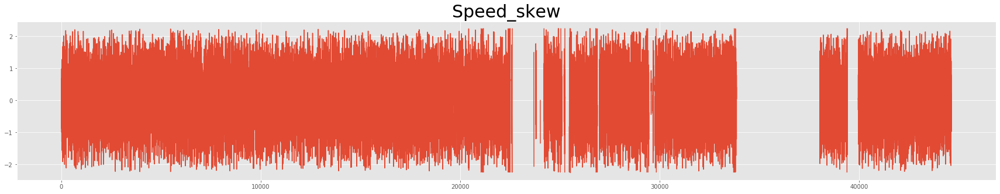

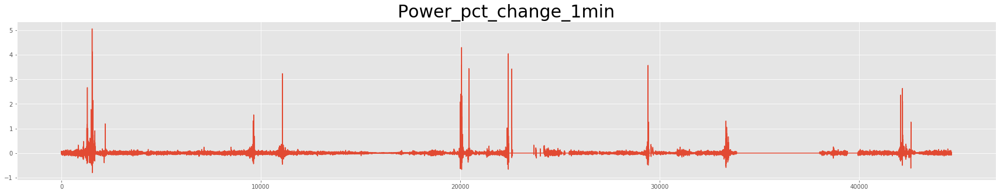

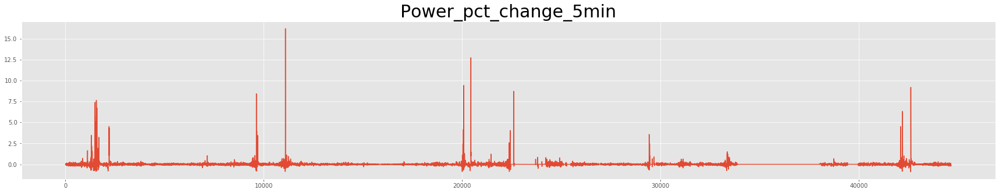

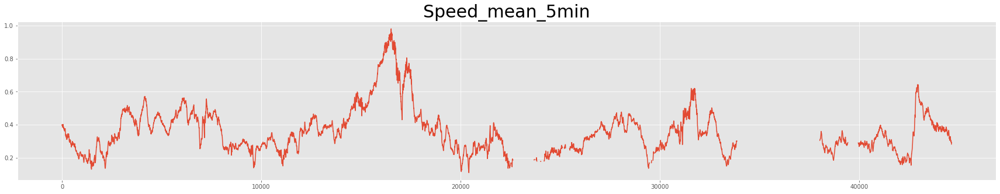

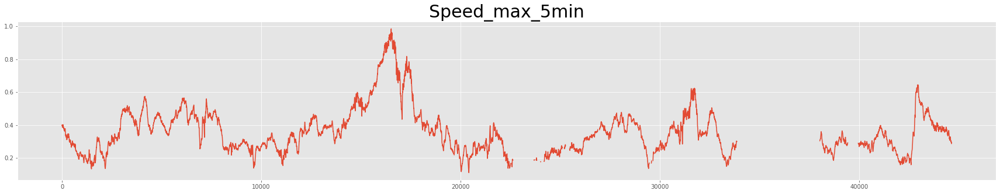

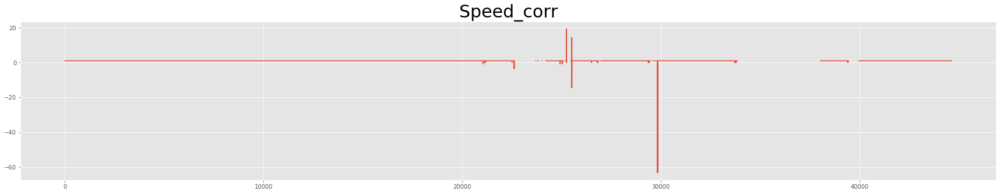

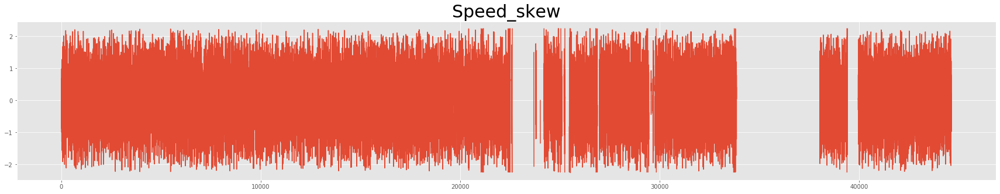

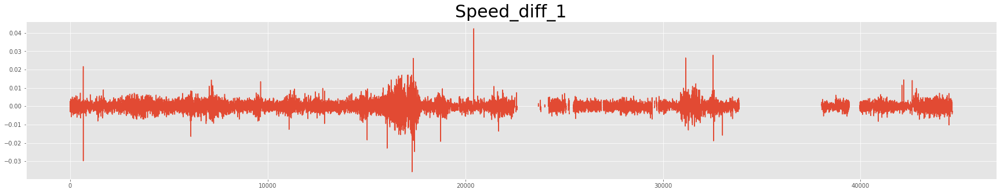

In [49]:
fig=plt.figure(figsize=(30,5))
plt.plot(data['Speed_skew'])
plt.title('Speed_skew',size=30)

fig=plt.figure(figsize=(30,5))
plt.plot(data['Power_pct_change_1min'])
plt.title('Power_pct_change_1min',size=30)

fig=plt.figure(figsize=(30,5))
plt.plot(data['Power_pct_change_5min'])
plt.title('Power_pct_change_5min',size=30)

fig=plt.figure(figsize=(30,5))
plt.plot(data['Speed_mean_5min'])
plt.title('Speed_mean_5min',size=30)

fig=plt.figure(figsize=(30,5))
plt.plot(data['Speed_max_5min'])
plt.title('Speed_max_5min',size=30)

fig=plt.figure(figsize=(30,5))
plt.plot(data['Speed_corr'])
plt.title('Speed_corr',size=30)

fig=plt.figure(figsize=(30,5))
plt.plot(data['Speed_skew'])
plt.title('Speed_skew',size=30)

fig=plt.figure(figsize=(30,5))
plt.plot(data['Speed_diff_1'])
plt.title('Speed_diff_1',size=30)



## 4.2 时间序列的去趋势特征

#### 选取前13天完整的数据
#### 分别将Speed和Power分解为趋势（Trend）、季节性（Seasonality，此处periods取一天）、随机误差（Residual）

In [50]:
data =pd.read_csv('Fengdian_with30min_filled.csv')
data=data.query('day<=13')
decomposition1 = sm.tsa.seasonal_decompose(data['avg_Speed'] ,model='addictive', period=1440)
trend_Sp=decomposition1.trend
seasonal_Sp=decomposition1.seasonal
residual_Sp=decomposition1.resid
data['Sp_trend']=trend_Sp
data['Sp_seasonal']=seasonal_Sp
data['Sp_residual']=residual_Sp

decomposition2 = sm.tsa.seasonal_decompose(data['avg_Power'] ,model='addictive', period=1440)
trend_Wp=decomposition2.trend
seasonal_Wp=decomposition2.seasonal
residual_Wp=decomposition2.resid
data['Wp_trend']=trend_Wp
data['Wp_seasonal']=seasonal_Wp
data['Wp_residual']=residual_Wp
pd.set_option('display.max_rows', None)
data

,Time,day,avg_Power,avg_Speed,TimeinDay,Sp_trend,Sp_seasonal,Sp_residual,Wp_trend,Wp_seasonal,Wp_residual
0,00:00:00,1,0.375040,0.396095,1,NaN,0.004764,NaN,NaN,-0.008604,NaN
1,00:01:00,1,0.387105,0.395585,2,NaN,0.005163,NaN,NaN,-0.010657,NaN
2,00:02:00,1,0.417485,0.397490,3,NaN,0.005892,NaN,NaN,-0.007089,NaN
3,00:03:00,1,0.407600,0.400170,4,NaN,0.006740,NaN,NaN,-0.011143,NaN
4,00:04:00,1,0.407325,0.402390,5,NaN,0.006942,NaN,NaN,-0.016283,NaN
5,00:05:00,1,0.386900,0.401765,6,NaN,0.007326,NaN,NaN,-0.017769,NaN
6,00:06:00,1,0.405495,0.398790,7,NaN,0.007380,NaN,NaN,-0.016282,NaN
7,00:07:00,1,0.416115,0.400335,8,NaN,0.008336,NaN,NaN,-0.009909,NaN
8,00:08:00,1,0.402420,0.400835,9,NaN,0.009274,NaN,NaN,-0.008921,NaN
9,00:09:00,1,0.390015,0.399435,10,NaN,0.009393,NaN,NaN,-0.009214,NaN


<Figure size 3456x2592 with 0 Axes>

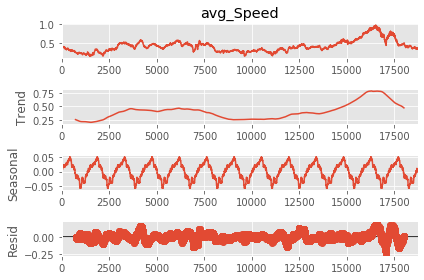

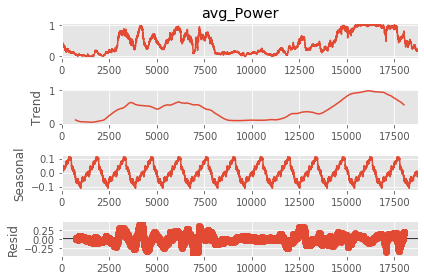

In [51]:
pd.reset_option('display.max_rows')
fig = plt.figure(figsize=(48, 36))
data =pd.read_csv('Fengdian_with30min_filled.csv')
data=data.query('day<=13')
decomposition1 = sm.tsa.seasonal_decompose(data['avg_Speed'] ,model='addictive', period=1440)
decomposition1.plot()
plt.show()
decomposition2 = sm.tsa.seasonal_decompose(data['avg_Power'] ,model='addictive', period=1440)
decomposition2.plot()
plt.show()


## 4.3 数据的自相关性和偏相关性

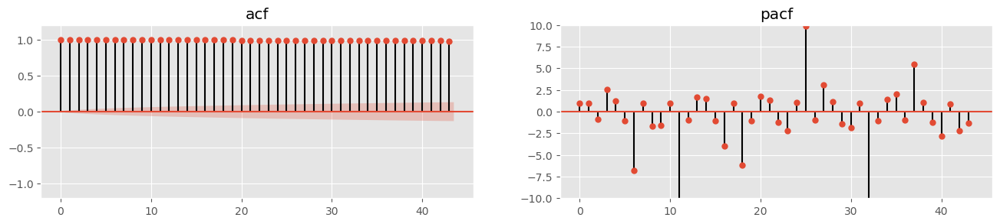

In [52]:
df_orig =pd.read_csv('Fengdian_with30min_filled.csv')
# # plt.plot(df_orig['avg_Speed'])
# plot_acf(df_orig.query('day <= 13')['avg_Speed']) #画出acf函数
# plt.show()

fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(16,3),dpi=100)
plot_acf(df_orig.query('day <= 13')['avg_Speed'],ax=ax[0])
ax[0].set_title("acf")
ax[0].set_ylim(-1.2,1.2)
plot_pacf(df_orig.query('day <= 13')['avg_Speed'],ax=ax[1])
ax[1].set_title("pacf")
ax[1].set_ylim(-10,10)


plt.show()

## 4.4 傅里叶分析

In [53]:
def filter_signal(signal, threshold=1e3):
    fourier = rfft(signal)
    frequencies = rfftfreq(signal.size, d=20e-3/signal.size)
    fourier[frequencies > threshold] = 0
    ind  = frequencies<threshold
    ax.stem(frequencies[ind], np.abs(fourier)[ind], 'b', markerfmt=" ", basefmt="-b")
    return irfft(fourier)



### 4.4.1Speed的傅里叶去噪声

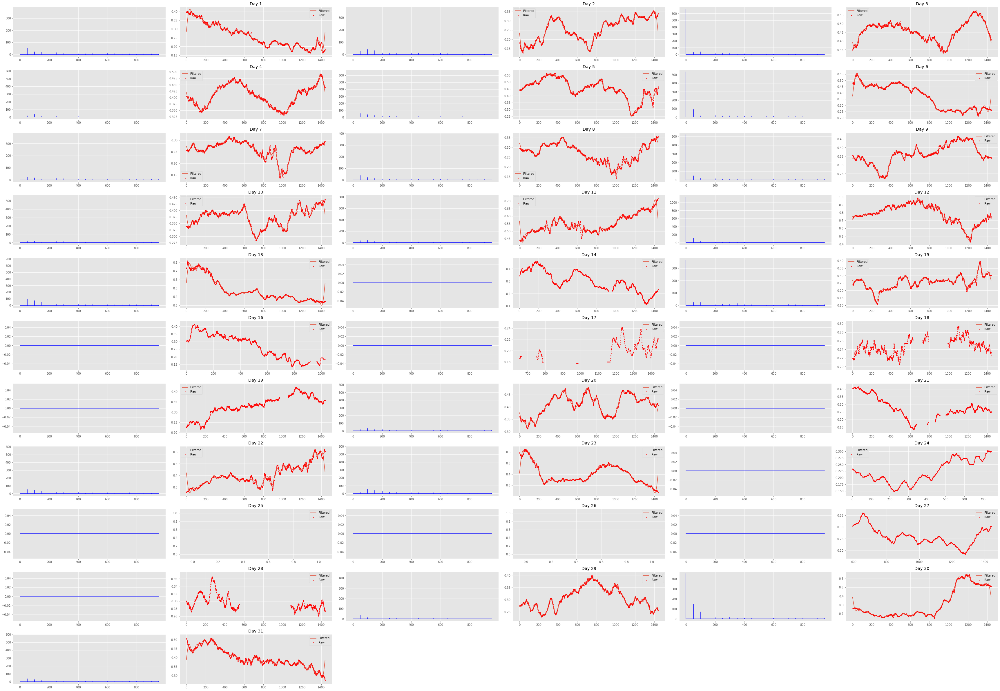

In [54]:
fig = plt.figure(figsize=(48, 36))
days = np.arange(1, 32, 1)
data =pd.read_csv('Fengdian_with30min_filled.csv')
for i in days:
    speed_i = data.query(f'day=={i}')['avg_Speed']
    times = data.query(f'day=={i}')['TimeinDay']
    ax = fig.add_subplot(12, 6, 2*i-1)
    filtered = filter_signal(speed_i, threshold=1e3)
    ax = fig.add_subplot(12, 6, 2*i)
    ax.scatter(times, speed_i, s=5, label='Raw', color='red')
    ax.plot(filtered, label='Filtered')
    # ax.scatter(times, power_i, s=5, label='Power')
    ax.set_title(f'Day {i}')
    ax.legend()

fig.tight_layout()
plt.show()

### 4.4.2 Power的傅里叶去噪声

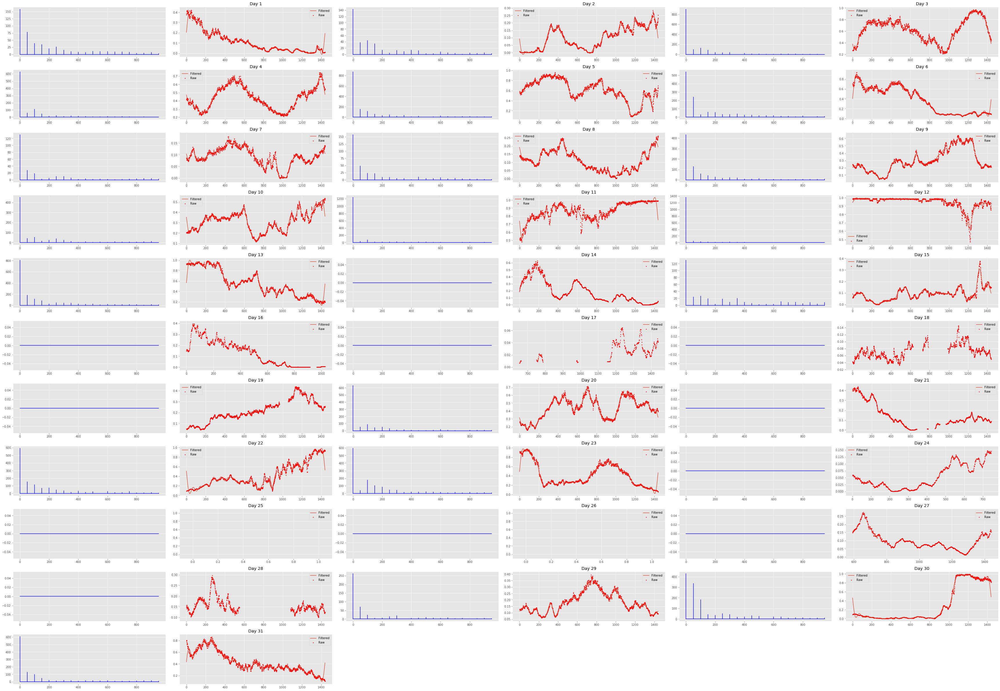

In [55]:
fig = plt.figure(figsize=(48, 36))
days = np.arange(1, 32, 1)
data =pd.read_csv('Fengdian_with30min_filled.csv')
for i in days:
    power_i = data.query(f'day=={i}')['avg_Power']
    times = data.query(f'day=={i}')['TimeinDay']
    ax = fig.add_subplot(12, 6, 2*i-1)
    filtered = filter_signal(power_i, threshold=1e3)
    ax = fig.add_subplot(12, 6, 2*i)
    ax.scatter(times, power_i, s=5, label='Raw', color='red')
    ax.plot(filtered, label='Filtered')
    # ax.scatter(times, power_i, s=5, label='Power')
    ax.set_title(f'Day {i}')
    ax.legend()

fig.tight_layout()
plt.show()

# 5 规范化存储

#### 原始数据
原始数据：`Fengdiandata.csv`
#### 预处理
- step1-把缺失的时间都留成空行：`Fengdian_addNAN.csv`
- step2-同一时间点的数据取平均：`Fengdian_AVG.csv`，只保留平均值丢弃原值：`Fengdian_CleanAVG.csv`
- step3-用移动平均法填充零散点的缺失值：`Fengdian_with30min_filled.csv`
- step4-loess平滑后的数据：`Fengdian_after_smoothing.csv`
#### 提取特征
- step5-提取特征后：`Fengdian_factors_nosmoothing.csv`

### 5.1 原始数据：Fengdiandata.csv

In [56]:
pd.reset_option('display.max_rows')
df1=pd.read_csv('Fengdiandata.csv')
df1

,DateAcqTime,GridPower,wind_Spd
0,2015/10/1 0:00,0.38065,0.39627
1,2015/10/1 0:00,0.36943,0.39592
2,2015/10/1 0:01,0.38529,0.39538
3,2015/10/1 0:01,0.38892,0.39579
4,2015/10/1 0:02,0.41220,0.39627
...,...,...,...
74875,2015/10/31 23:57,0.10177,0.27803
74876,2015/10/31 23:58,0.10354,0.27682
74877,2015/10/31 23:58,0.10008,0.27529
74878,2015/10/31 23:59,0.10516,0.27481


### 5.2 Fengdian_addNAN.csv

In [57]:
df2=pd.read_csv('Fengdian_addNAN.csv')
df2=df2.drop(df2.columns[0],axis=1)
df2

,Time,day,DateAcqTime,GridPower,wind_Spd
0,00:00:00,1,2015/10/1 0:00,0.38065,0.39627
1,00:00:00,1,2015/10/1 0:00,0.36943,0.39592
2,00:01:00,1,2015/10/1 0:01,0.38529,0.39538
3,00:01:00,1,2015/10/1 0:01,0.38892,0.39579
4,00:02:00,1,2015/10/1 0:02,0.41220,0.39627
...,...,...,...,...,...
89275,23:57:00,31,2015/10/31 23:57,0.10177,0.27803
89276,23:58:00,31,2015/10/31 23:58,0.10354,0.27682
89277,23:58:00,31,2015/10/31 23:58,0.10008,0.27529
89278,23:59:00,31,2015/10/31 23:59,0.10516,0.27481


### 5.3 Fengdian_AVG.csv

In [58]:
df3=pd.read_csv('Fengdian_AVG.csv')
df3

,Time,day,DateAcqTime,GridPower,wind_Spd,avg_Power,avg_Speed,TimeinDay
0,00:00:00,1,2015/10/1 0:00,0.38065,0.39627,0.375040,0.396095,1
1,00:01:00,1,2015/10/1 0:01,0.38529,0.39538,0.387105,0.395585,2
2,00:02:00,1,2015/10/1 0:02,0.41220,0.39627,0.417485,0.397490,3
3,00:03:00,1,2015/10/1 0:03,0.40035,0.39998,0.407600,0.400170,4
4,00:04:00,1,2015/10/1 0:04,0.41225,0.40208,0.407325,0.402390,5
...,...,...,...,...,...,...,...,...
44635,23:55:00,31,2015/10/31 23:55,0.11486,0.28516,0.112720,0.284815,1436
44636,23:56:00,31,2015/10/31 23:56,0.11032,0.28276,0.110270,0.282165,1437
44637,23:57:00,31,2015/10/31 23:57,0.10308,0.27962,0.102425,0.278825,1438
44638,23:58:00,31,2015/10/31 23:58,0.10354,0.27682,0.101810,0.276055,1439


### 5.4 Fengdian_CleanAVG.csv

In [59]:
df4=pd.read_csv('Fengdian_CleanAVG.csv')
df4

,Time,day,avg_Power,avg_Speed,TimeinDay
0,00:00:00,1,0.375040,0.396095,1
1,00:01:00,1,0.387105,0.395585,2
2,00:02:00,1,0.417485,0.397490,3
3,00:03:00,1,0.407600,0.400170,4
4,00:04:00,1,0.407325,0.402390,5
...,...,...,...,...,...
44635,23:55:00,31,0.112720,0.284815,1436
44636,23:56:00,31,0.110270,0.282165,1437
44637,23:57:00,31,0.102425,0.278825,1438
44638,23:58:00,31,0.101810,0.276055,1439


### 5.5 Fengdian_with30min_filled.csv

In [60]:
df5=pd.read_csv('Fengdian_with30min_filled.csv')
df5

,Time,day,avg_Power,avg_Speed,TimeinDay
0,00:00:00,1,0.375040,0.396095,1
1,00:01:00,1,0.387105,0.395585,2
2,00:02:00,1,0.417485,0.397490,3
3,00:03:00,1,0.407600,0.400170,4
4,00:04:00,1,0.407325,0.402390,5
...,...,...,...,...,...
44635,23:55:00,31,0.112720,0.284815,1436
44636,23:56:00,31,0.110270,0.282165,1437
44637,23:57:00,31,0.102425,0.278825,1438
44638,23:58:00,31,0.101810,0.276055,1439


### 5.6 Fengdian_after_smoothing.csv

In [61]:
df6=pd.read_csv('Fengdian_after_smoothing.csv')
df6

,Time,day,avg_Power,avg_Speed,TimeinDay,loess_1_Speed,loess_1_Power
0,00:00:00,1,0.375040,0.396095,1,0.396911,0.407430
1,00:01:00,1,0.387105,0.395585,2,0.397402,0.407142
2,00:02:00,1,0.417485,0.397490,3,0.397851,0.406777
3,00:03:00,1,0.407600,0.400170,4,0.398262,0.406370
4,00:04:00,1,0.407325,0.402390,5,0.398647,0.405961
...,...,...,...,...,...,...,...
44635,23:55:00,31,0.112720,0.284815,1436,0.283718,0.113897
44636,23:56:00,31,0.110270,0.282165,1437,0.281727,0.110216
44637,23:57:00,31,0.102425,0.278825,1438,0.279655,0.106508
44638,23:58:00,31,0.101810,0.276055,1439,0.277504,0.102801


### 5.7 Fengdian_factors_nosmoothing.csv

In [62]:
df7=pd.read_csv('Fengdian_factors_nosmoothing.csv')
df7

,Time,day,avg_Power,avg_Speed,TimeinDay,Power_pct_change_1min,Speed_pct_change_1min,Power_pct_change_5min,Speed_pct_change_5min,Speed_mean_5min,...,Speed_max_5min,Power_max_5min,Speed_min_5min,Power_min_5min,Speed_corr,Speed_skew,Speed_diff_1,Power_corr,Power_skew,Power_diff_1
0,00:00:00,1,0.375040,0.396095,1,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00:01:00,1,0.387105,0.395585,2,0.032170,-0.001288,NaN,NaN,0.396095,...,0.396095,0.375040,0.396095,0.375040,NaN,NaN,NaN,NaN,NaN,NaN
2,00:02:00,1,0.417485,0.397490,3,0.078480,0.004816,NaN,NaN,0.395840,...,0.396095,0.387105,0.395585,0.375040,NaN,NaN,-0.000510,NaN,NaN,0.012065
3,00:03:00,1,0.407600,0.400170,4,-0.023677,0.006742,NaN,NaN,0.396390,...,0.397490,0.417485,0.395585,0.375040,NaN,NaN,0.001905,NaN,NaN,0.030380
4,00:04:00,1,0.407325,0.402390,5,-0.000675,0.005548,NaN,NaN,0.397335,...,0.400170,0.417485,0.395585,0.375040,NaN,NaN,0.002680,NaN,NaN,-0.009885
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44635,23:55:00,31,0.112720,0.284815,1436,-0.003932,-0.009442,-0.181112,-0.022380,0.291761,...,0.294645,0.137650,0.287530,0.113165,1.0,-0.970752,-0.004260,1.0,-0.970752,-0.006065
44636,23:56:00,31,0.110270,0.282165,1437,-0.021735,-0.009304,-0.188266,-0.038636,0.290457,...,0.294645,0.135845,0.284815,0.112720,1.0,-0.584600,-0.002715,1.0,-0.584600,-0.000445
44637,23:57:00,31,0.102425,0.278825,1438,-0.071144,-0.011837,-0.215945,-0.053692,0.288189,...,0.294645,0.130635,0.282165,0.110270,1.0,0.187158,-0.002650,1.0,0.187158,-0.002450
44638,23:58:00,31,0.101810,0.276055,1439,-0.006004,-0.009935,-0.146104,-0.053926,0.285025,...,0.291790,0.119230,0.278825,0.102425,1.0,0.216154,-0.003340,1.0,0.216154,-0.007845
